<a href="https://colab.research.google.com/github/mehdihosseinimoghadam/Signal-Processing/blob/main/VAE_for_Wav_Reconstruction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
from torch import nn
## Some imports
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import IPython.display as idp
import torch
import torchaudio
import torchaudio.transforms as T
import librosa
import matplotlib.pyplot as plt
import IPython.display as ipd
import pandas as pd

In [ ]:
def plot_spectrogram(spec, title=None, ylabel='freq_bin', aspect='auto', xmax=None):
  fig, axs = plt.subplots(1, 1)
  axs.set_title(title or 'Spectrogram (db)')
  axs.set_ylabel(ylabel)
  axs.set_xlabel('frame')
  im = axs.imshow(librosa.power_to_db(spec), origin='lower', aspect=aspect)
  if xmax:
    axs.set_xlim((0, xmax))
  fig.colorbar(im, ax=axs)
  plt.figure(figsize=(10,30))
  plt.show(block=False)

In [ ]:
plt.rcParams["figure.figsize"] = (20,4)
n_fft = 1024
win_length = None
hop_length = 512
n_mels = 128
sample_rate = 16000

mel_spectrogram = T.MelSpectrogram(
    sample_rate=sample_rate,
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
    center=True,
    pad_mode="reflect",
    power=2.0,
    norm='slaney',
    onesided=True,
    n_mels=n_mels,
    mel_scale="htk",
)

In [ ]:
! pip install kaggle

In [ ]:
! mkdir ~/.kaggle

In [ ]:
! cp kaggle.json ~/.kaggle/

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d luantm/speech-commands-tensorflow

100% 4.51G/4.51G [01:26<00:00, 52.9MB/s]
100% 4.51G/4.51G [01:26<00:00, 55.7MB/s]


In [ ]:
%%capture
!unzip /content/speech-commands-tensorflow.zip

## DataLoader Structure

- Class: EnglishCommands
  - __init__
  - __len__
  - __getitem__
   - change_sample_rate
   - right_padding
   - mix_down
   - transformations
   - cut_signal


In [ ]:
import csv

with open('/content/speechdataset/SpeechDataset/testing_list.txt', 'r') as in_file:
    stripped = (line.strip() for line in in_file)
    lines = (line.split("/") for line in stripped if line)
    with open('log.csv', 'w') as out_file:
        writer = csv.writer(out_file)
        writer.writerow(('command', 'path'))
        writer.writerows(lines)

In [ ]:
from matplotlib.cbook import get_label
from torch.utils.data import Dataset
import torchaudio
class EnglishCommands(Dataset):
  def __init__(self,
               annotation_file,
               audio_dir,
               target_sample_rate,
               transformation,
               num_sample):


    self.annotation_file = pd.read_csv(annotation_file).iloc[1:1000,:]
    self.audio_dir = audio_dir
    self.target_sample_rate = target_sample_rate
    self.transformation = transformation
    self.num_sample = num_sample


  def __len__(self):
    return len(self.annotation_file)


  def __getitem__(self, index):
    path = self.get_path(index)
    label = self.get_label(index)
    signal, sr = torchaudio.load(path)
    signal = self.change_sample_rate(signal, sr)
    signal = self.right_padding(signal)
    signal = self.cut_signal(signal)
    signal = self.transformation(signal)
    return signal, label



  def get_path(self, index):
    path = str(self.audio_dir) + "/" + str(self.annotation_file.iloc[index,0]) + "/" + str(self.annotation_file.iloc[index,1])  
    return path


  def get_label(self, index):  
    return self.annotation_file.iloc[index,0]

  def change_sample_rate(self, signal, sr):
    if sr != self.target_sample_rate:  
       signal = torchaudio.transforms.Resample(sr, self.target_sample_rate)
       return signal  
    return signal   

  def right_padding(self, signal):
    if signal.shape[1] < self.num_sample:
      padd = self.num_sample - signal.shape[1] 
      last_dim_padding = (0, padd)
      signal = torch.nn.functional.pad(signal, last_dim_padding)
      return signal
    return signal  


  def cut_signal(self, signal): 
    if signal.shape[1] > self.num_sample:
       signal = signal[:, :self.num_sample]
       return signal
    return signal   


999
(tensor([[[2.2711e-01, 3.7324e-02, 3.3804e-02,  ..., 1.2152e+00,
          6.2450e-02, 3.5692e-01],
         [9.6858e-02, 1.7977e-02, 4.1976e-01,  ..., 2.3965e+00,
          1.6095e+00, 9.0400e-01],
         [9.7352e-02, 1.1866e-01, 7.7365e-01,  ..., 3.9120e+00,
          4.1662e+00, 2.0406e+00],
         ...,
         [7.4076e-04, 7.2965e-04, 2.5004e-03,  ..., 7.7937e-04,
          1.4489e-03, 1.2459e-03],
         [9.3401e-04, 5.8919e-04, 2.1035e-03,  ..., 1.8868e-03,
          1.1003e-03, 8.7202e-04],
         [9.0534e-04, 4.3136e-04, 9.4019e-04,  ..., 1.4105e-03,
          1.6796e-03, 2.3815e-03]]]), 'right')
torch.Size([1, 128, 32])


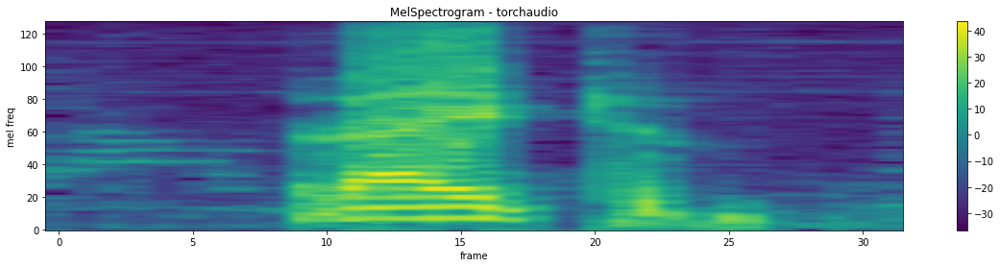

<Figure size 720x2160 with 0 Axes>

In [ ]:
import torchvision.transforms as transform
SR = 16000
N_FFT=1024
HOP_LENGTH=512
N_MELS=128

melspec = torchaudio.transforms.MelSpectrogram(sample_rate = SR,
                                               n_fft = N_FFT,
                                               window_fn = torch.hann_window,
                                               hop_length = HOP_LENGTH,
                                               n_mels = N_MELS)



# trans = transform.Compose([
#                            transform.ToTensor(),
#                            melspec
# ])




EC = EnglishCommands("/content/log.csv",
                "/content/speechdataset/SpeechDataset",
                16000,
                melspec,
                16000)

print(len(EC))
print(EC[6])
print(EC[6][0].shape)

plot_spectrogram(
    EC[6][0][0], title="MelSpectrogram - torchaudio", ylabel='mel freq')
ipd.Audio(EC.get_path(6))

## Full VAE Code

In [ ]:
import torch
from torch import nn
import torchaudio.transforms as transforms

In [ ]:
class ConvBlock(nn.Module):
  def __init__(self, in_channels, out_channels):
    super(ConvBlock, self).__init__()
    self.in_channels = in_channels
    self.out_channels = out_channels
    self.Conv = nn.Sequential(
        nn.Conv2d(self.in_channels,
                  self.out_channels,
                  4,
                  2,
                  1),
        nn.BatchNorm2d(self.out_channels),
        nn.LeakyReLU()          
    )
  def forward(self, x):
    return self.Conv(x)  



class TransConvBlock(nn.Module):
  def __init__(self, in_channels, out_channels):
    super(TransConvBlock, self).__init__()
    self.in_channels = in_channels
    self.out_channels = out_channels
    self.Conv = nn.Sequential(
        nn.ConvTranspose2d(self.in_channels,
                  self.out_channels,
                  4,
                  2,
                  1),
        nn.BatchNorm2d(self.out_channels),
        nn.LeakyReLU()          
    )
  def forward(self, x):
    return self.Conv(x)  






class Encode(nn.Module):
  def __init__(self, in_channels, out_channels, latent_dim, filter_num_list=[2, 4, 8]):
    super(Encode, self).__init__()
    self.in_channels = in_channels
    self.out_channels = out_channels
    self.latent_dim = latent_dim
    self.filter_num_list = filter_num_list

    self.Conv = nn.Sequential(
        ConvBlock(self.in_channels, self.out_channels),
        ConvBlock(self.out_channels, self.out_channels * self.filter_num_list[0]),
        ConvBlock(self.out_channels * self.filter_num_list[0], self.out_channels * self.filter_num_list[1]),
        ConvBlock(self.out_channels * self.filter_num_list[1], self.out_channels * self.filter_num_list[2])
    )

    self.fc = nn.Linear(8 * self.out_channels * 8 * 2, self.latent_dim)
    self.mu = nn.Linear(self.latent_dim, self.latent_dim)
    self.logvar = nn.Linear(self.latent_dim, self.latent_dim)

  def forward(self, x):
    x = self.Conv(x)
    # print(x.shape)
    x = x.reshape(-1, 8 * self.out_channels * 8 * 2)
    x = self.fc(x)
    mu = self.mu(x)
    logvar = self.logvar(x)
    return mu, logvar


class Decoder(nn.Module):
  def __init__(self, in_channels, out_channels, latent_dim, filter_num_list=[2,4,8]):
    super(Decoder, self).__init__() 
    self.in_channels = in_channels
    self.out_channels = out_channels
    self.latent_dim = latent_dim
    self.filter_num_list = filter_num_list 

    self.DeConve = nn.Sequential(
        TransConvBlock(self.out_channels* self.filter_num_list[2] , self.out_channels * self.filter_num_list[1]),
        TransConvBlock(self.out_channels * self.filter_num_list[1], self.out_channels * self.filter_num_list[0]),
        TransConvBlock(self.out_channels * self.filter_num_list[0], self.out_channels ),
        TransConvBlock(self.out_channels , self.in_channels)
    )
    self.fc = nn.Linear(latent_dim, 8 * self.out_channels * 8 * 2)


  def reparameterezation(self, mu, logvar):
    eps = torch.randn_like(logvar)
    z = mu + eps*torch.exp(.5*logvar) 
    return z


  def forward(self, mu, logvar): 
    z = self.reparameterezation(mu, logvar)
    # print(z.shape)
    z = nn.functional.relu(z)
    # print(z.shape)
    x = nn.functional.relu(self.fc(z))
    # print(x.shape)
    x = x.reshape(-1, 8 * self.out_channels ,8,2)
    x = torch.sigmoid(self.DeConve(x))
    return x, mu, logvar







class VAE(nn.Module):
  def __init__(self, in_channels, out_channels, latent_dim, filter_num_list=[2,4,8]):
    super(VAE, self).__init__()
    self.in_channels = in_channels
    self.out_channels = out_channels
    self.latent_dim = latent_dim
    self.filter_num_list = filter_num_list

    self.Encoder = Encode(self.in_channels,  self.out_channels, self.latent_dim)
    self.Decoder = Decoder(self.in_channels, self.out_channels, self.latent_dim)


  def forward(self, x):
    mu, logvar = self.Encoder(x)
    x, mu, logvar = self.Decoder(mu, logvar)
    return x, mu, logvar

In [ ]:
a = torch.rand(1,128,32).unsqueeze(0)
En = Encode(in_channels = 1, out_channels = 100, latent_dim = 1000)
En(a)[0].shape

torch.Size([1, 1000])

In [ ]:
b = torch.rand(1,1000)
De = Decoder(in_channels = 1, out_channels = 100, latent_dim = 1000)
x, mu, logvar = De(b,b)
x.shape

torch.Size([1, 1, 128, 32])

In [ ]:
import torchvision.datasets as Datasets
import torchvision.transforms as transform
from torch.utils.data import DataLoader 
device = 'cuda' if torch.cuda.is_available() else 'cpu'

import torchvision.transforms as transforms
from torch.utils.data import DataLoader
train_dataloader = DataLoader(EC, batch_size=4, shuffle=True)

In [ ]:
import torch.optim as optim
import torch.nn.functional as F
model = VAE(in_channels = 1, out_channels = 20, latent_dim = 128).to(device)
optimizer = optim.Adam(model.parameters(), lr=.0008)

num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print('Number of parameters: %d' % num_params)

Number of parameters: 1230635


In [ ]:
def VAE_loss(recon_x, x, mu, logvar):
  loss = F.binary_cross_entropy(recon_x, x, reduction='sum')
  kl_loss =  -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
  return loss + kl_loss  

In [ ]:
num_epochs = 500
print_per = 100
model.train()
for epoch in range(num_epochs):
    train_loss = 0
    print_loss = 0
    loss_record = []
    for i, (images, _) in enumerate(train_dataloader):
        images = images.to(device)
        optimizer.zero_grad()
        recon_batch, mu, logvar = model(images)
        loss = VAE_loss(recon_batch, images, mu, logvar)
        loss.backward()
        train_loss += loss.item()
        print_loss += loss.item()
        optimizer.step()
        if (i%print_per == 0):
            print("Epoch : {} , Minibatch : {} Loss = {:.4f}".format(epoch+1, i, print_loss))
            loss_record.append(print_loss)
            print_loss = 0
    print("Epoch {} : Loss = ({:.4f}) ".format(epoch+1, train_loss))

Epoch : 1 , Minibatch : 0 Loss = -21519.7383
Epoch : 1 , Minibatch : 100 Loss = -40689591.8533
Epoch : 1 , Minibatch : 200 Loss = -46468489.3491
Epoch 1 : Loss = (-116327127.5110) 
Epoch : 2 , Minibatch : 0 Loss = -127446.1875
Epoch : 2 , Minibatch : 100 Loss = -76141947.1445
Epoch : 2 , Minibatch : 200 Loss = -128700843.6270
Epoch 2 : Loss = (-289505809.7637) 
Epoch : 3 , Minibatch : 0 Loss = -336757.1250
Epoch : 3 , Minibatch : 100 Loss = -171179238.7812
Epoch : 3 , Minibatch : 200 Loss = -195042171.1484
Epoch 3 : Loss = (-477957435.4297) 
Epoch : 4 , Minibatch : 0 Loss = -300925.5000
Epoch : 4 , Minibatch : 100 Loss = -273957194.4219
Epoch : 4 , Minibatch : 200 Loss = -254172853.4062
Epoch 4 : Loss = (-630031307.2188) 
Epoch : 5 , Minibatch : 0 Loss = -527057.5625
Epoch : 5 , Minibatch : 100 Loss = -336563227.4883
Epoch : 5 , Minibatch : 200 Loss = -366007017.7578
Epoch 5 : Loss = (-844150778.0898) 
Epoch : 6 , Minibatch : 0 Loss = -2034511.8750
Epoch : 6 , Minibatch : 100 Loss = -4

torch.Size([128, 32])


<Figure size 9216x2304 with 0 Axes>

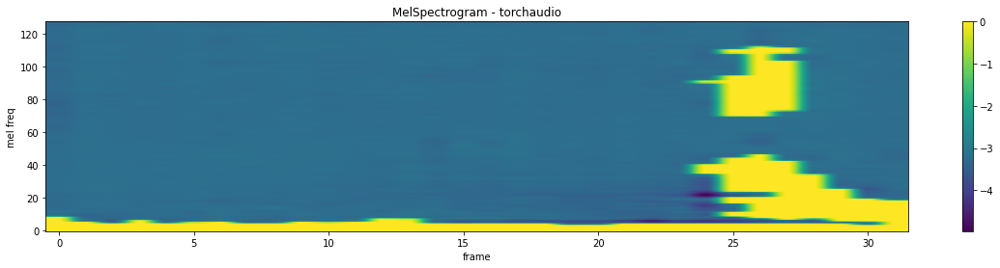

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


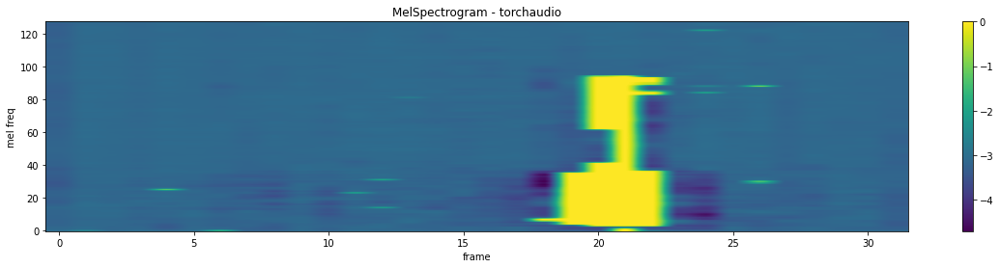

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


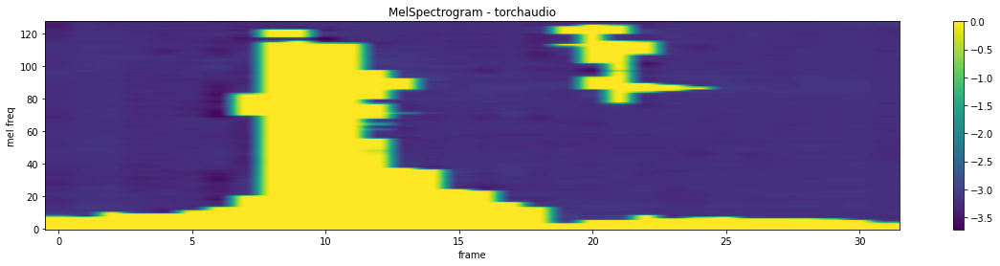

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


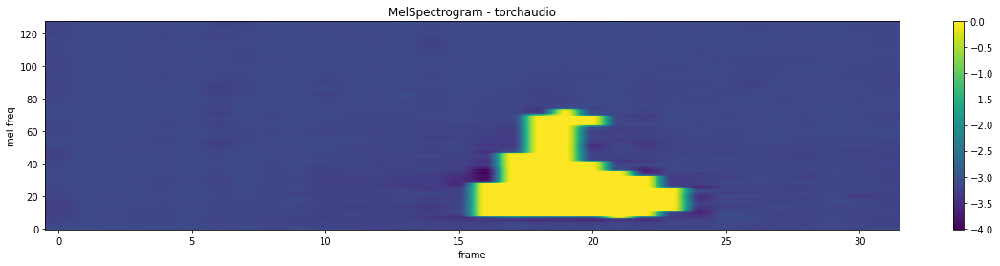

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


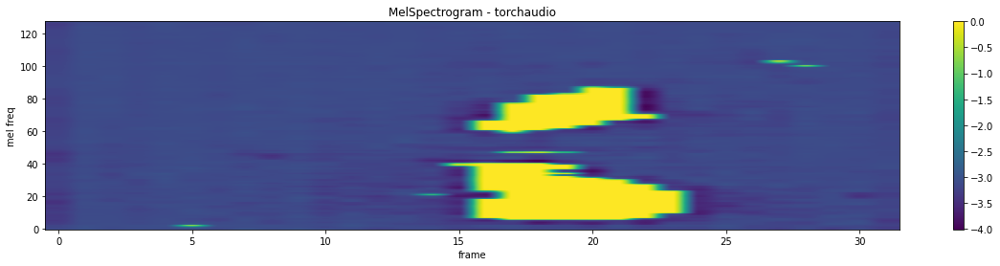

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


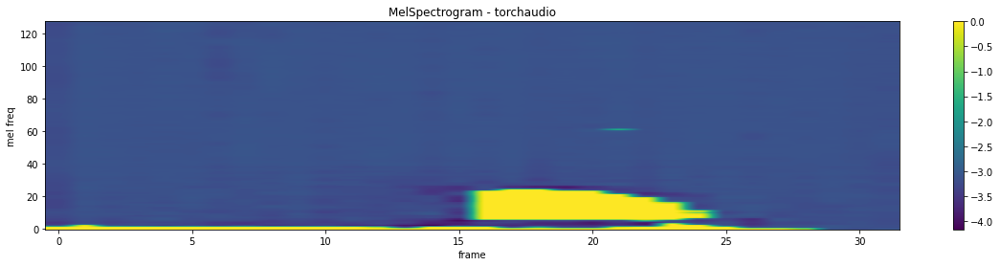

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


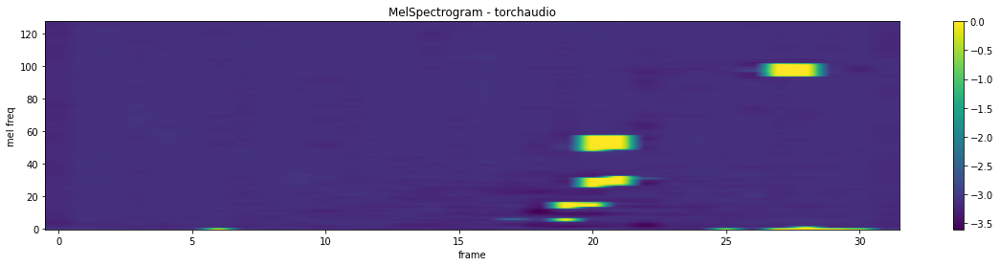

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


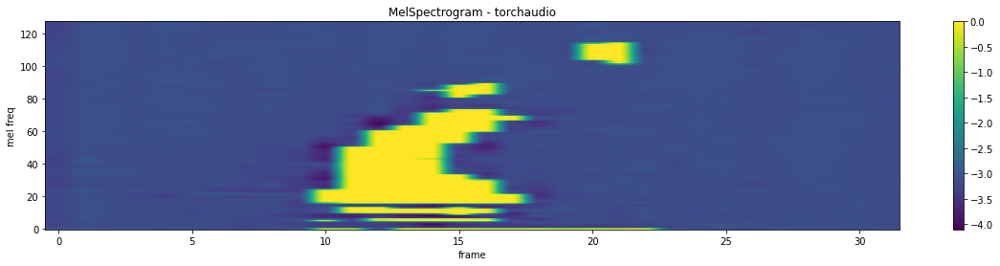

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


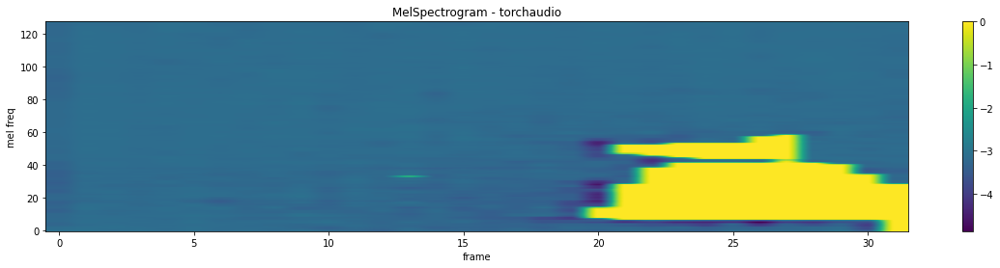

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


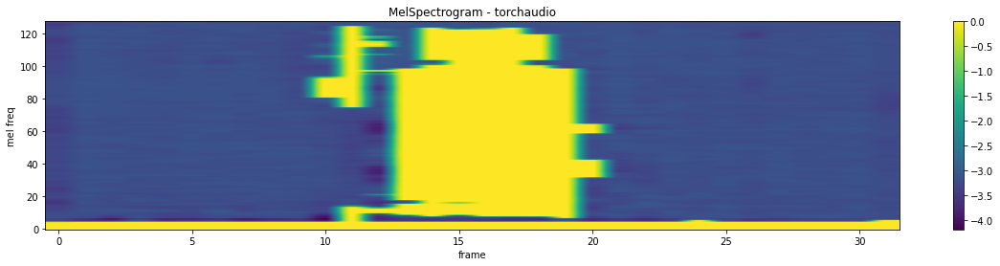

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


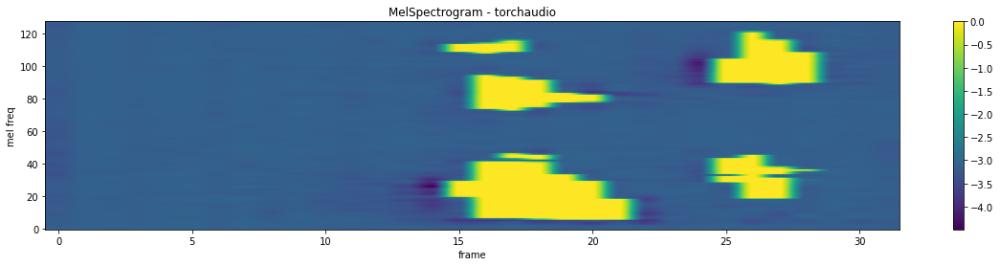

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


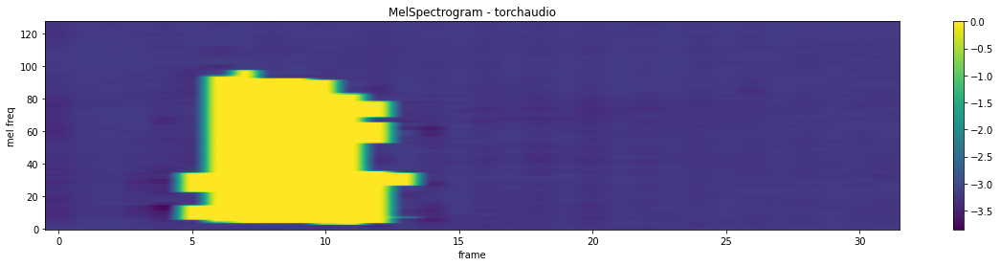

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


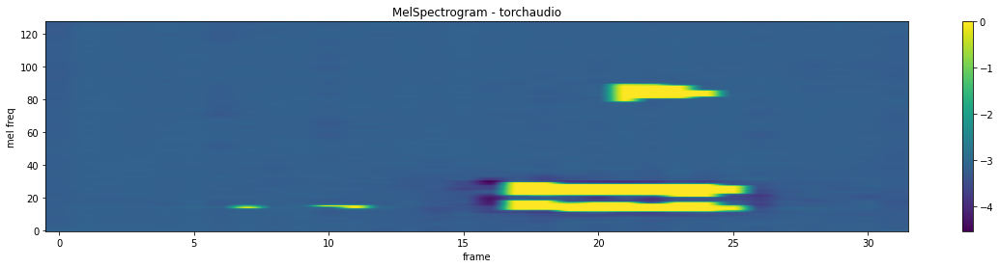

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


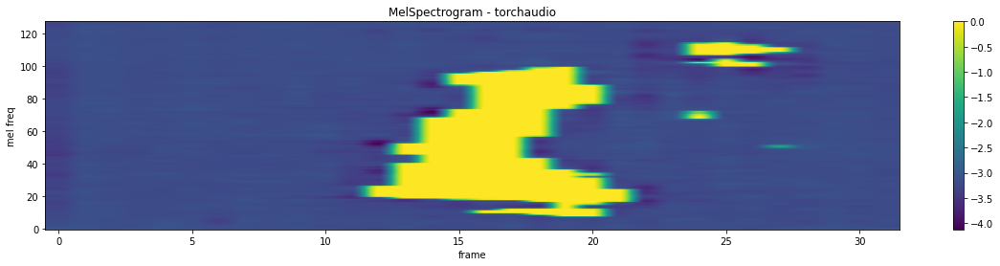

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


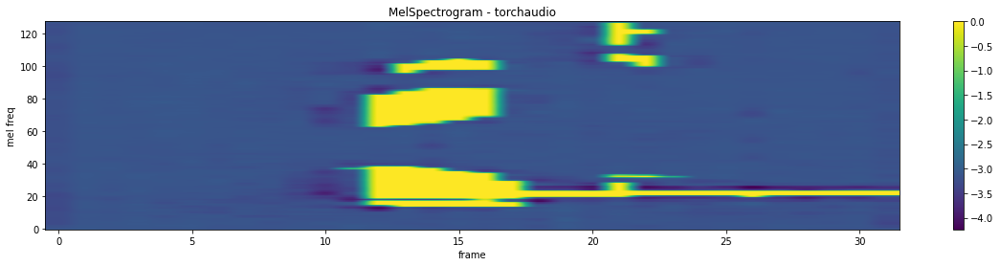

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


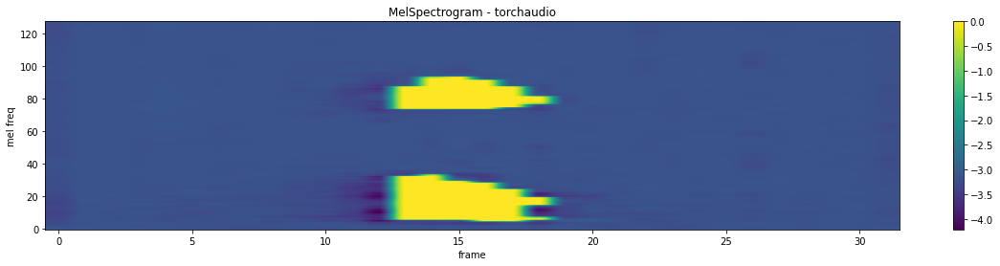

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


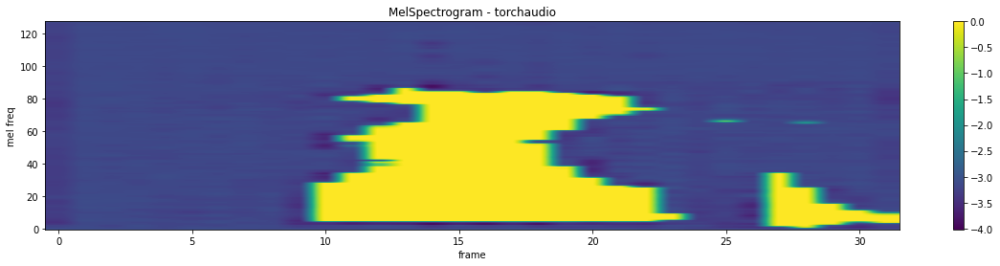

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


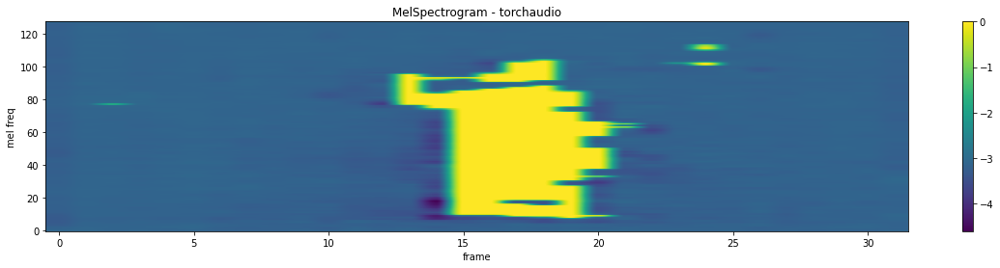

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


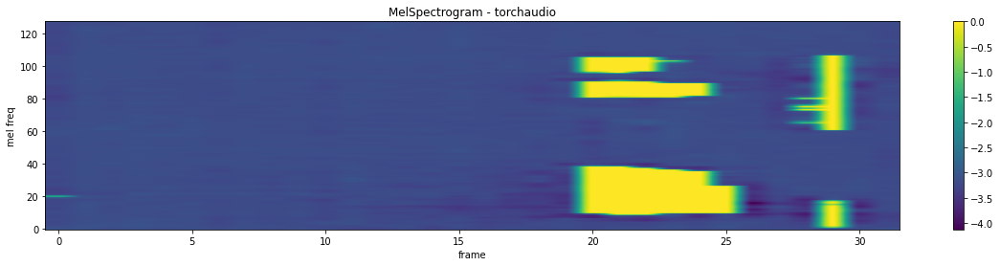

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


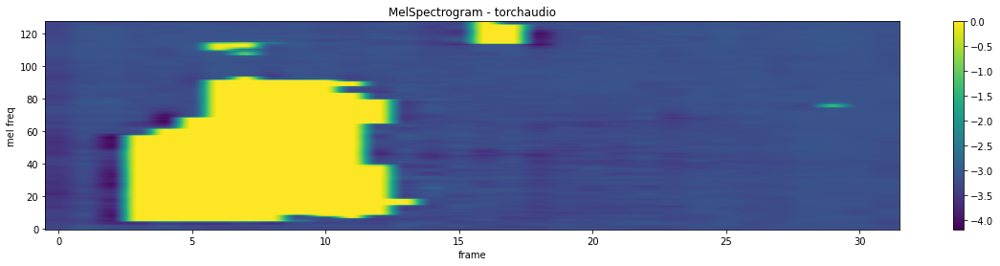

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


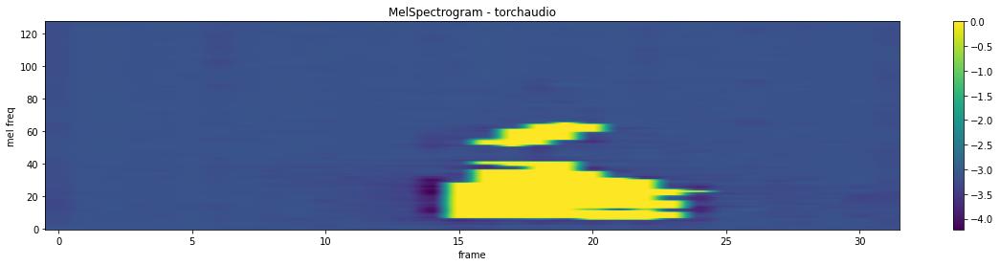

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


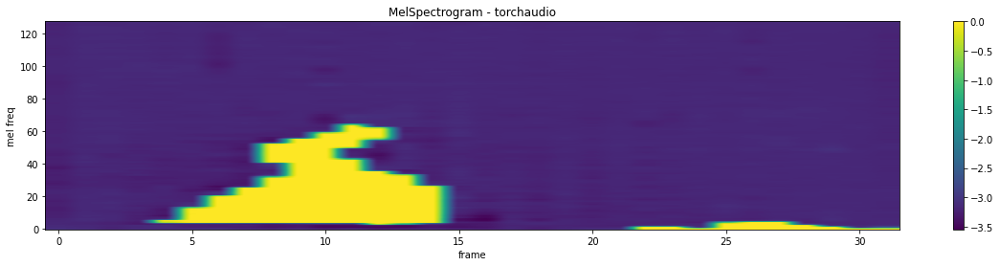

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


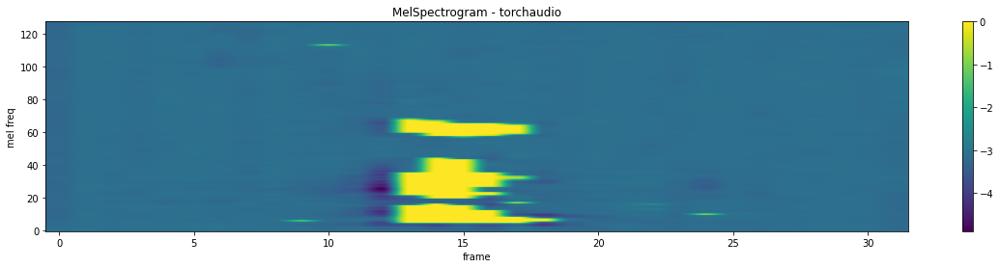

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


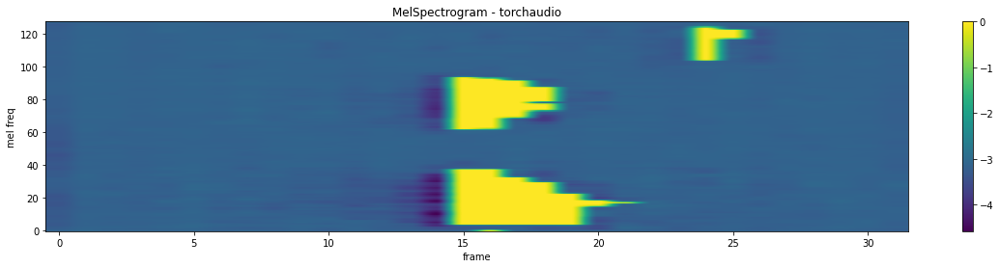

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


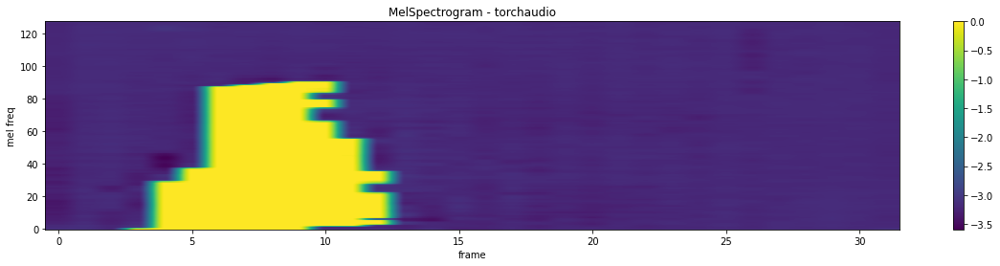

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


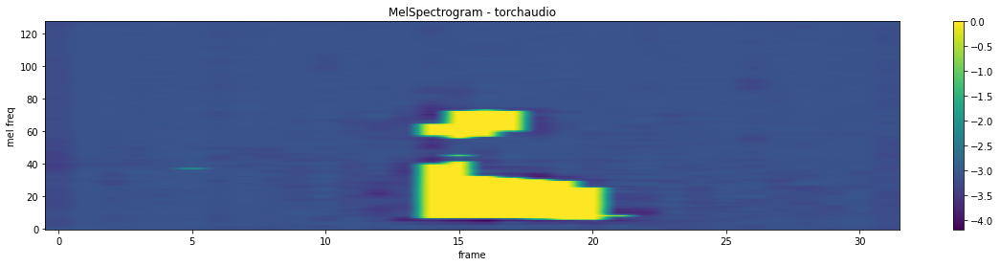

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


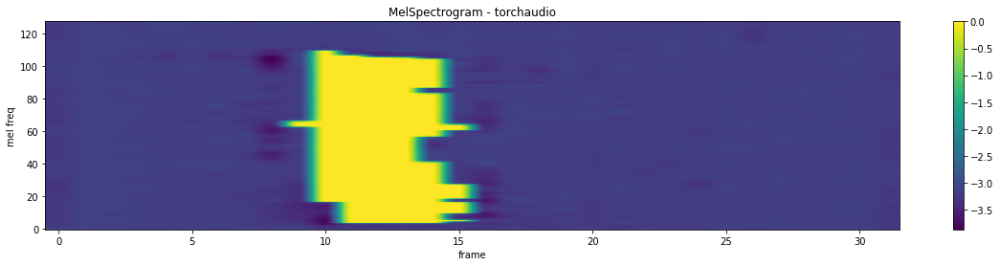

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


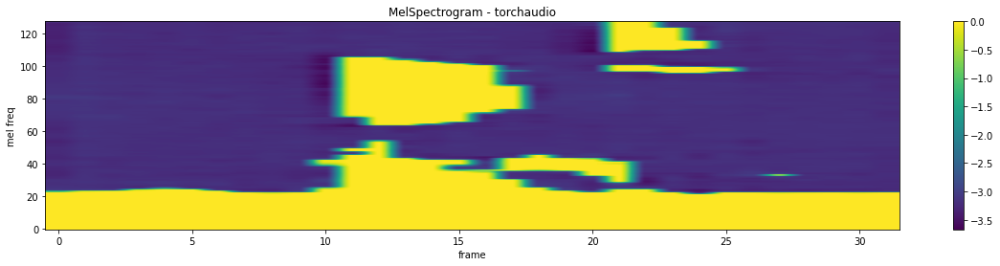

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


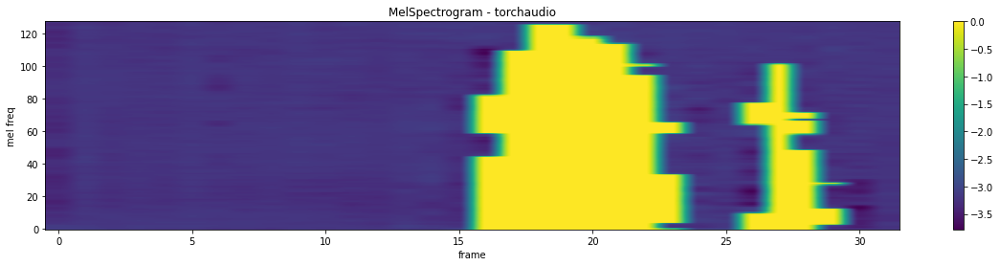

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


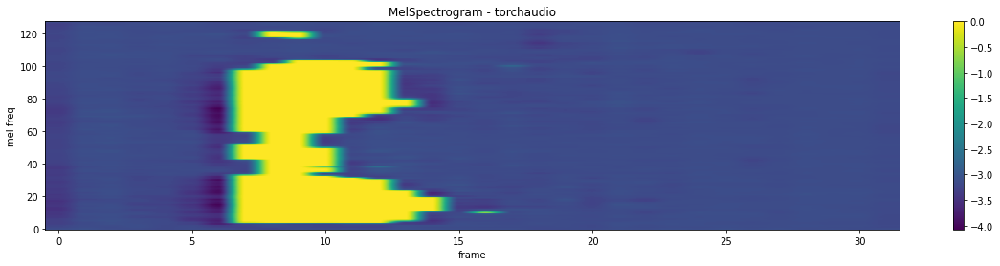

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


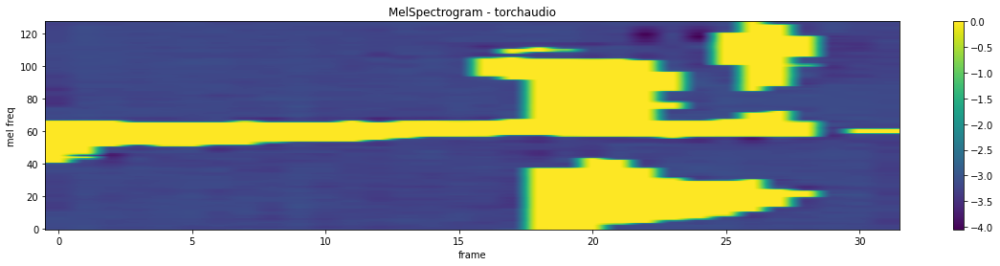

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


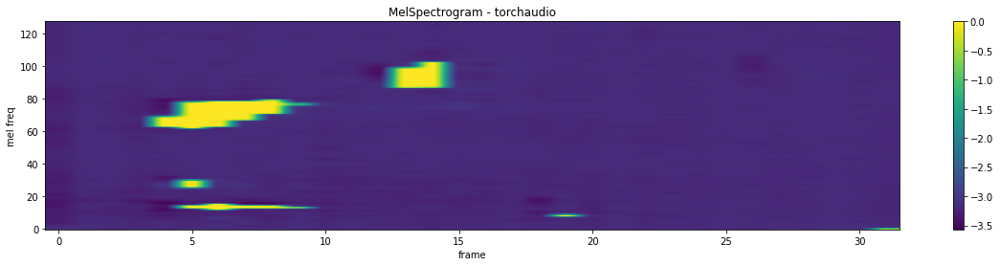

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


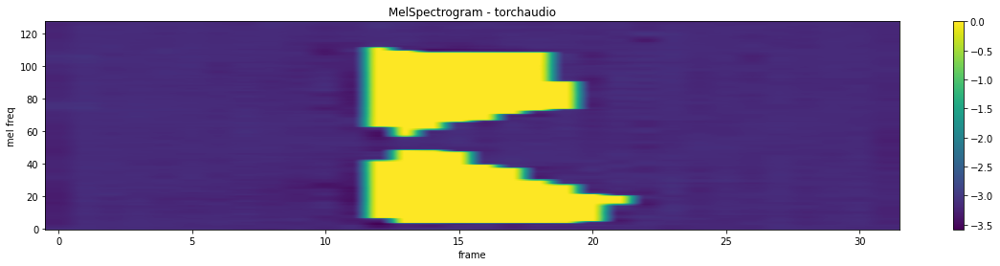

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


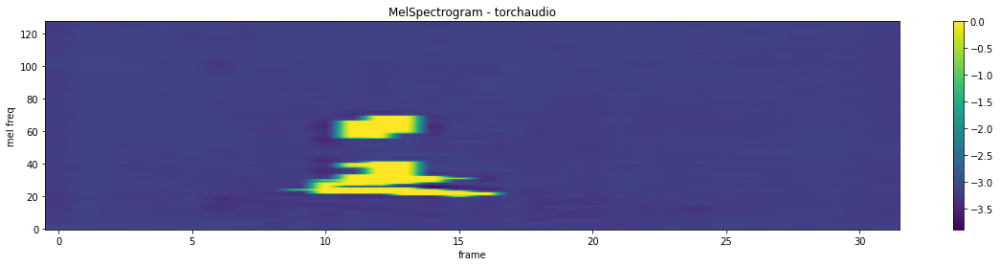

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


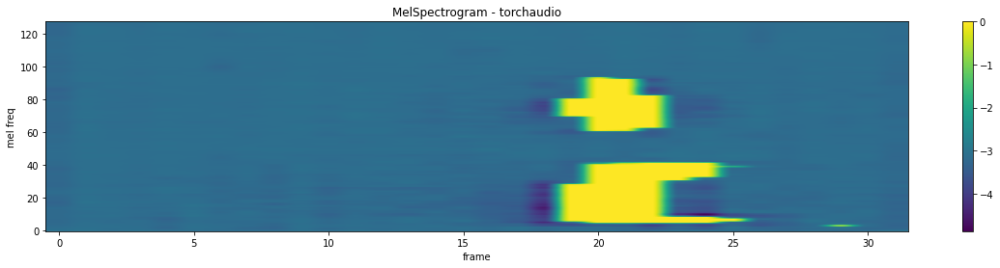

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


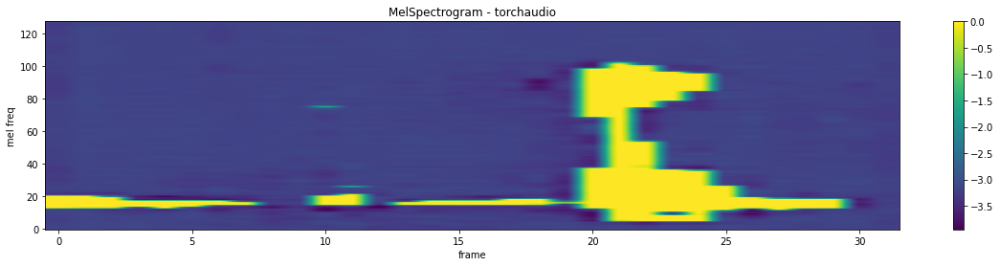

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


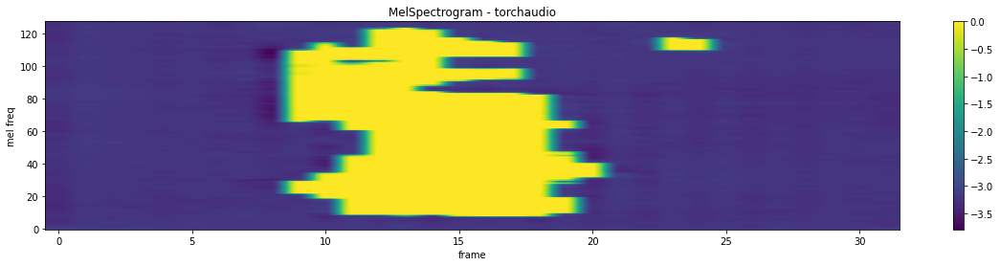

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


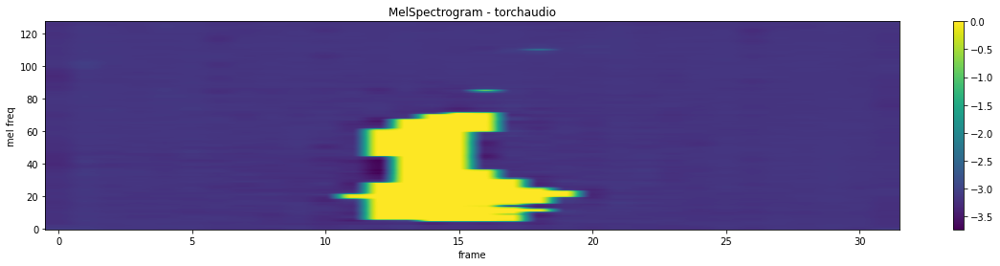

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


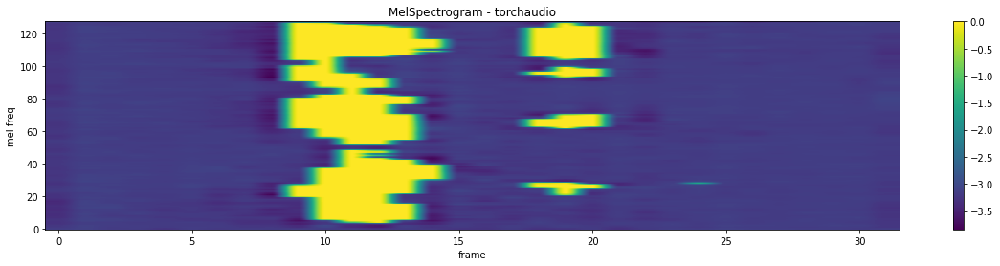

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


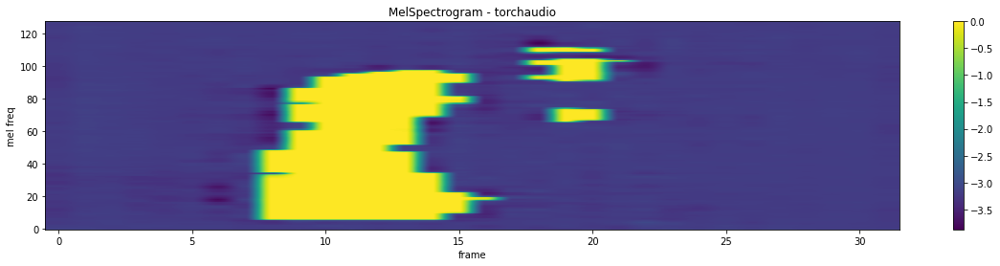

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


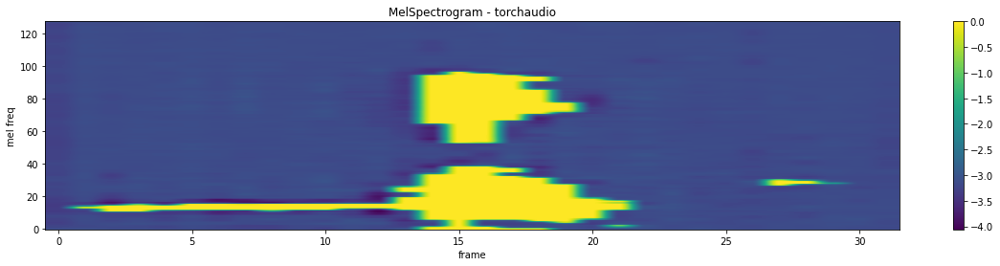

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


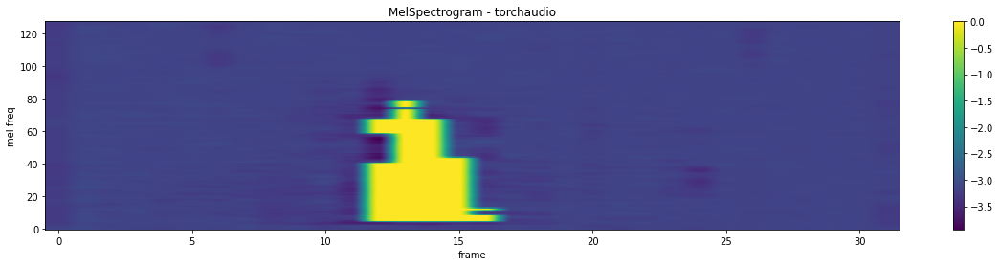

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


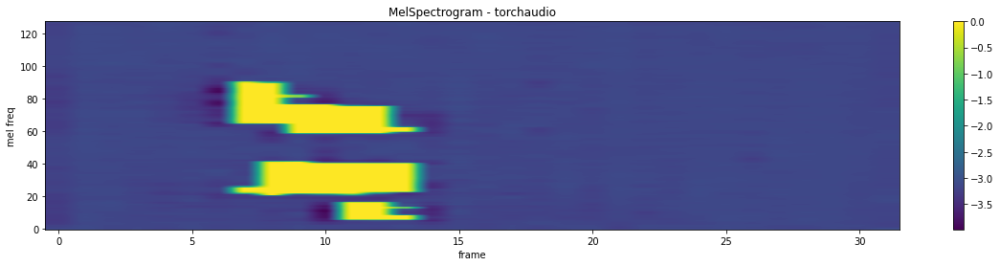

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


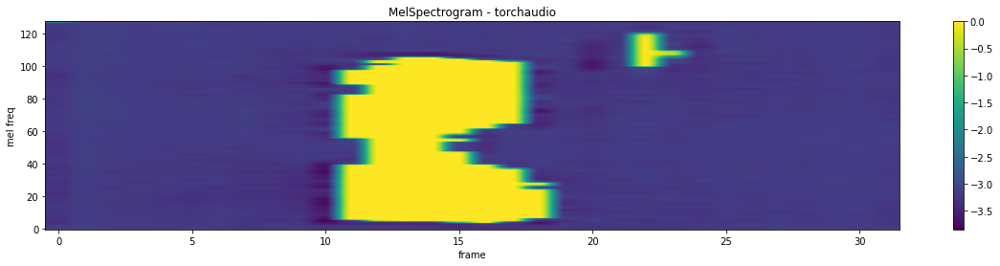

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


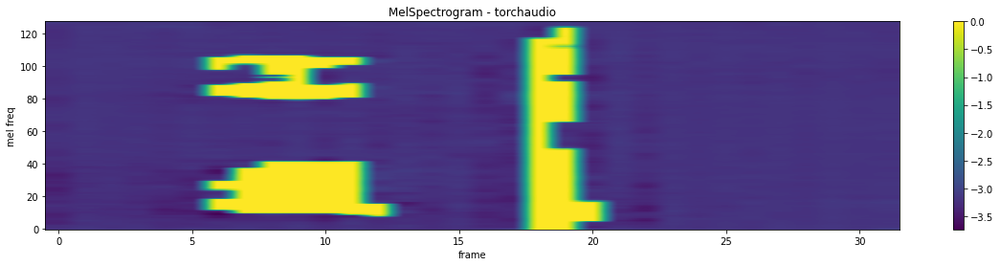

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


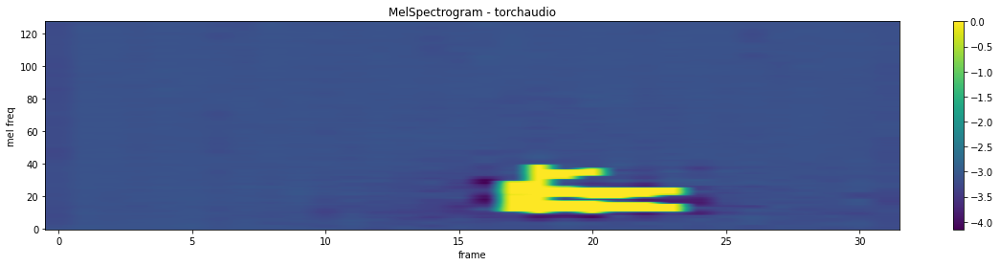

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


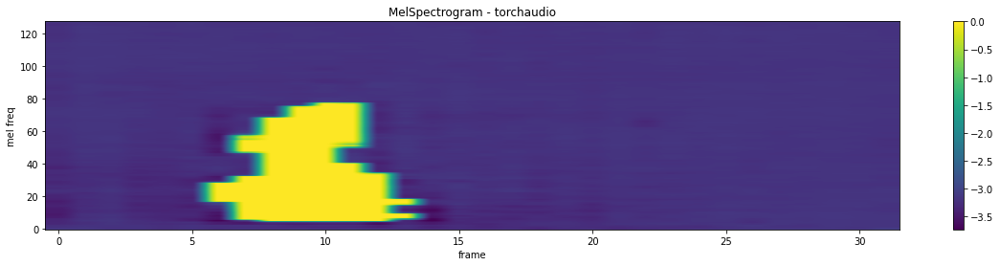

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


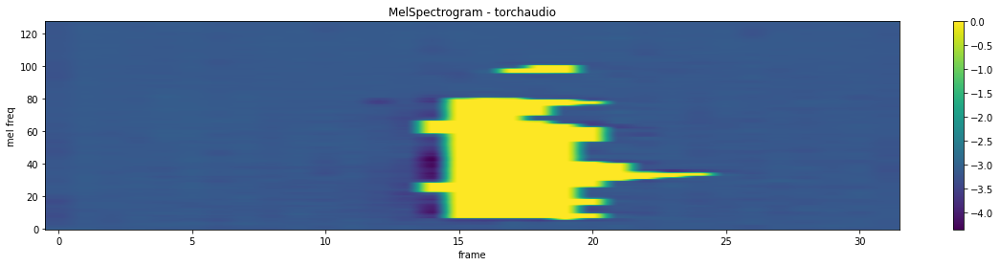

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


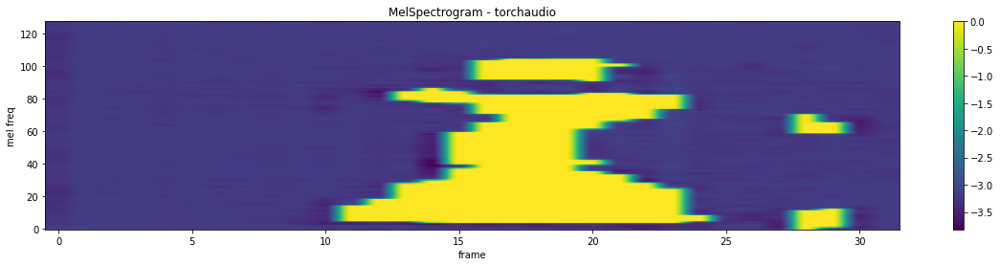

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


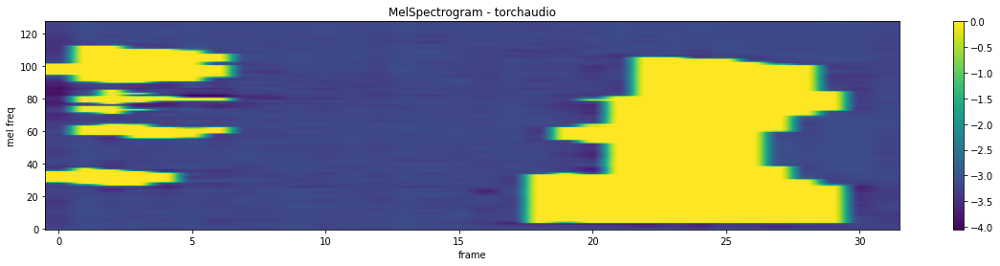

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


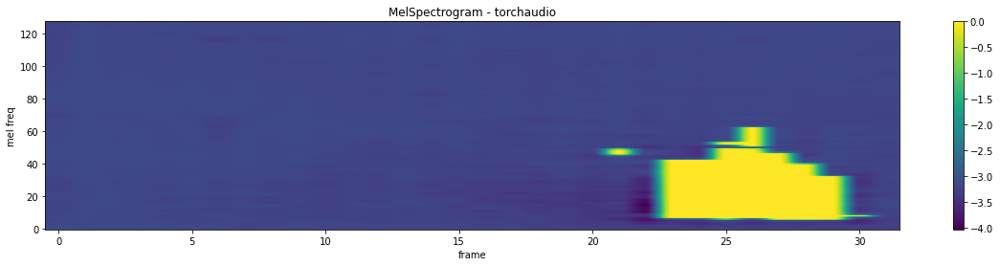

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


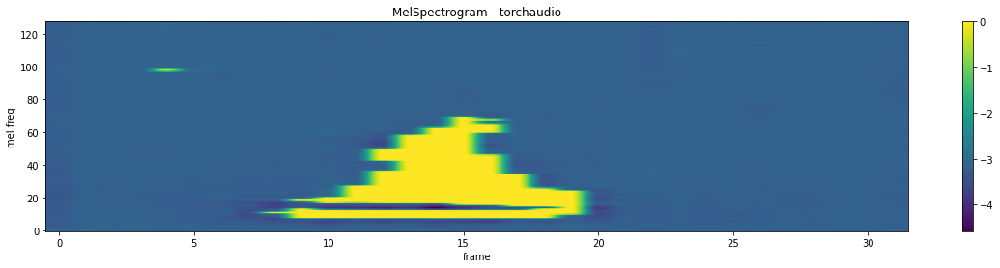

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


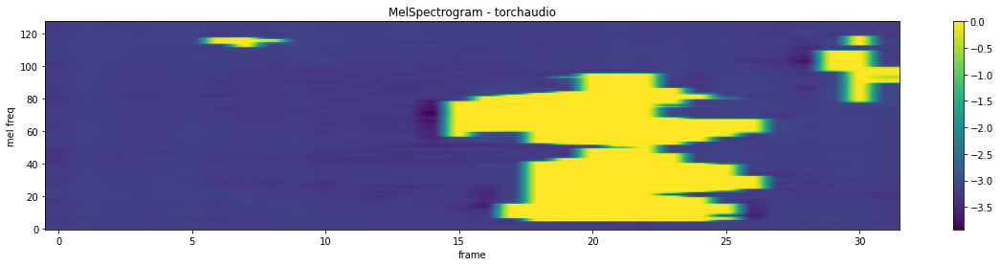

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


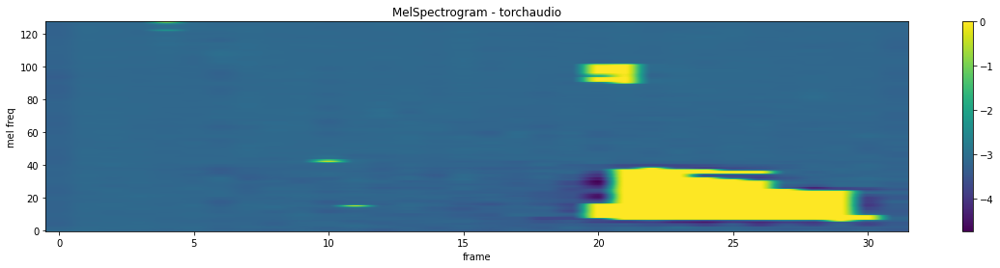

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


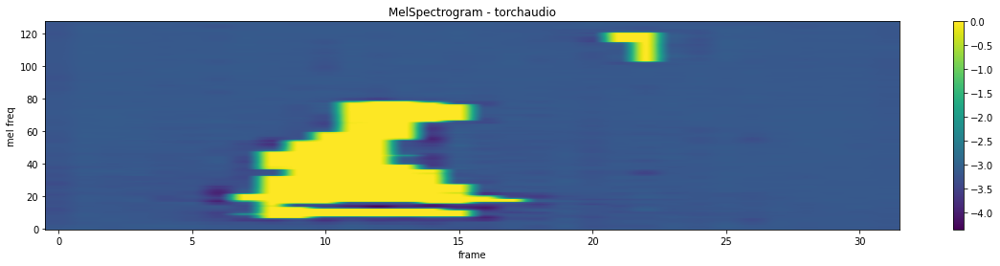

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


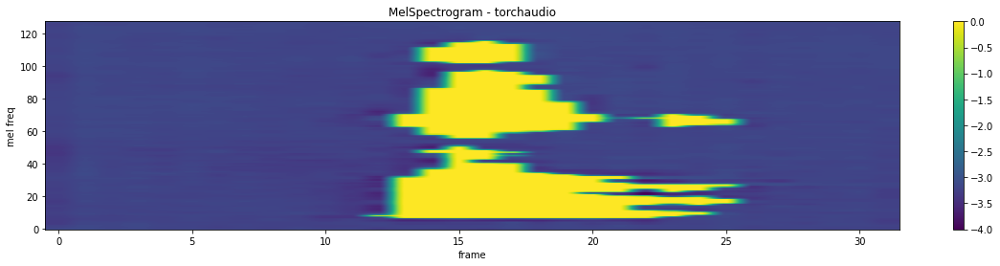

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


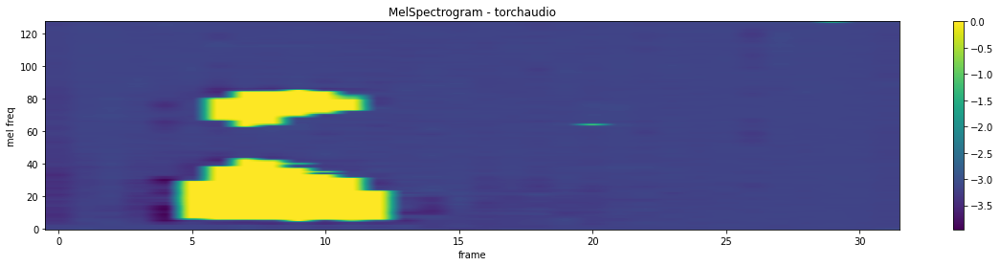

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


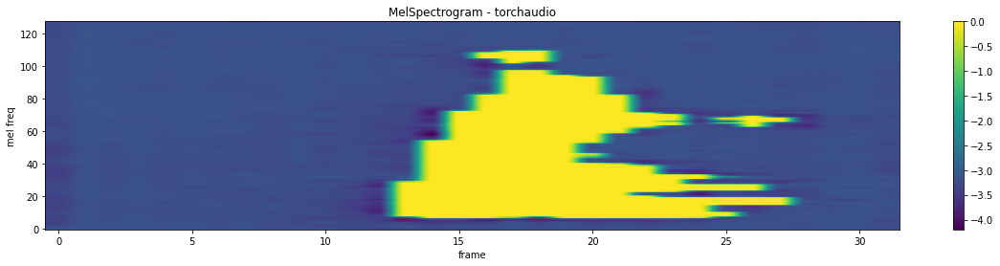

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


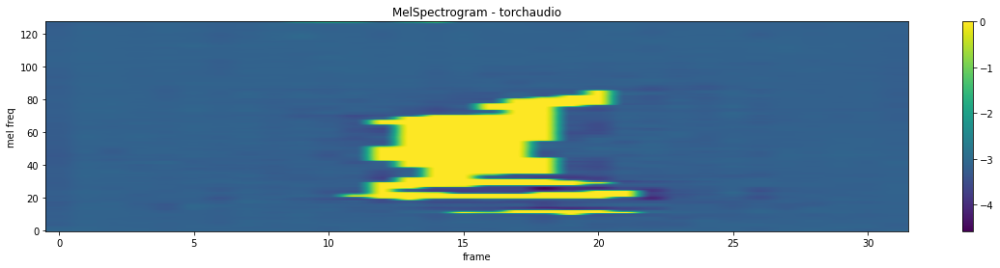

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


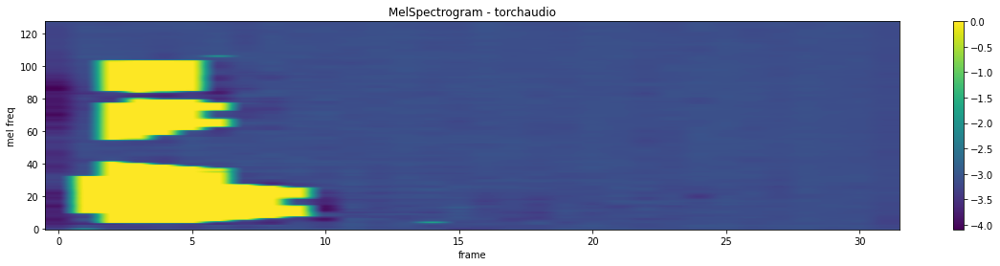

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


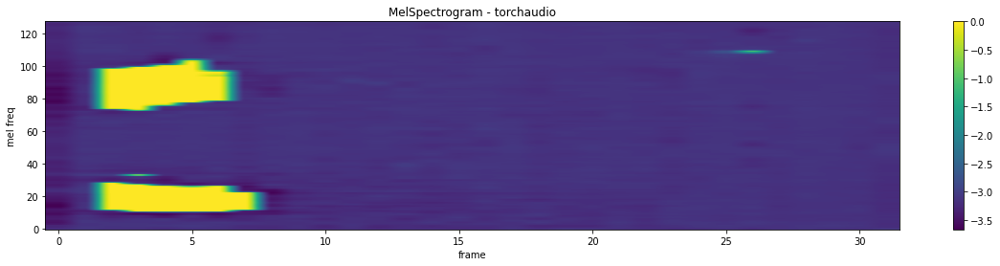

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


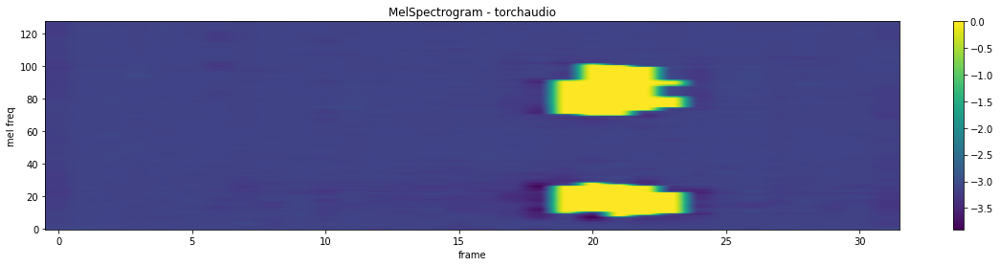

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


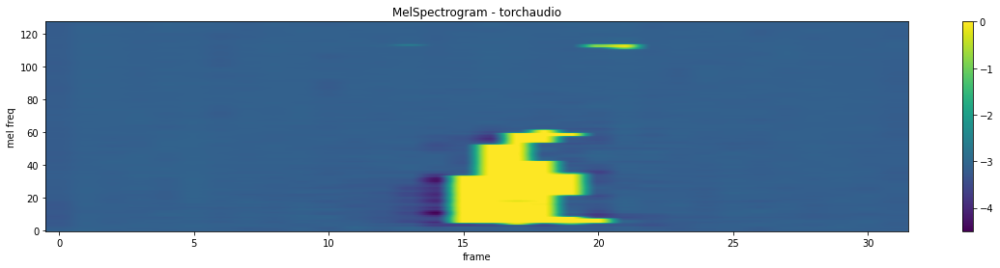

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


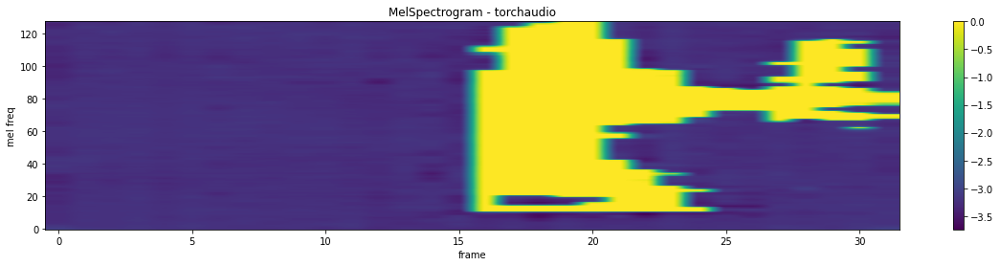

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


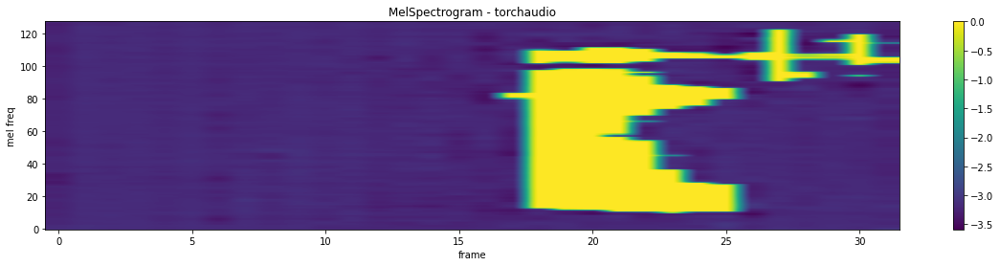

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


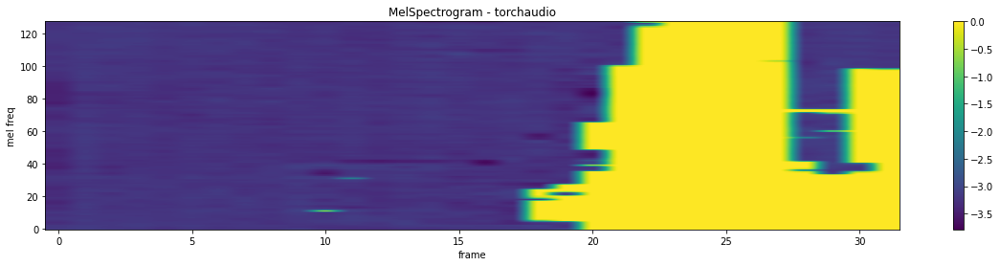

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


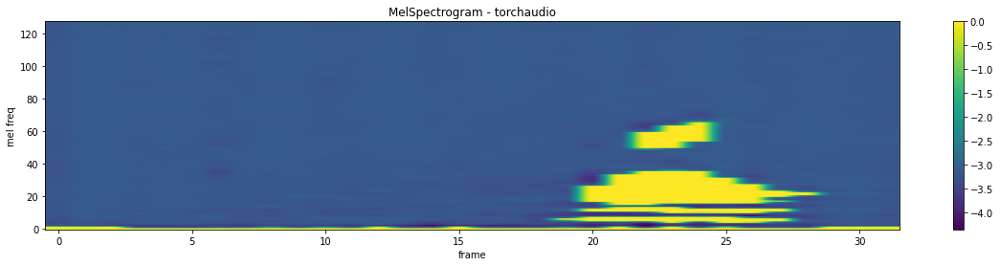

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


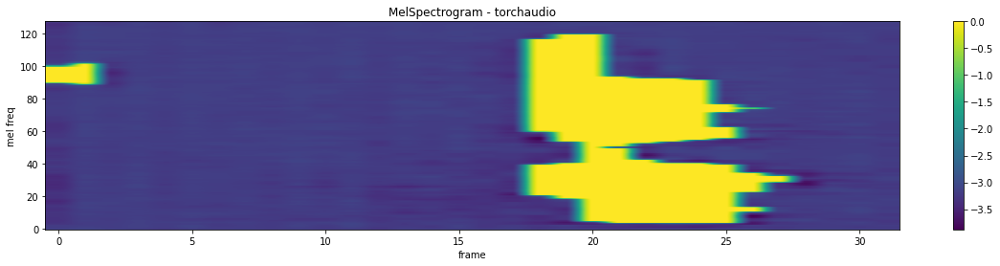

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


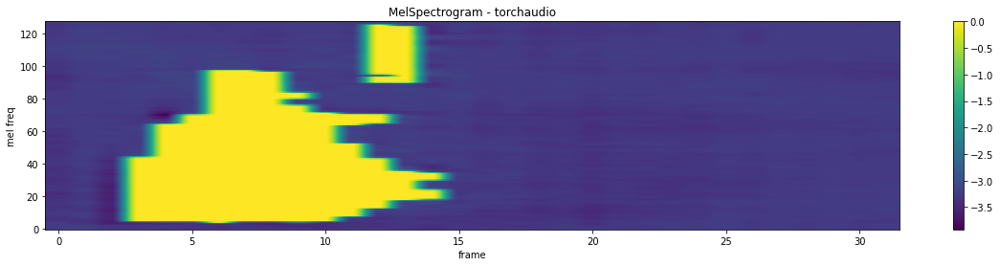

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


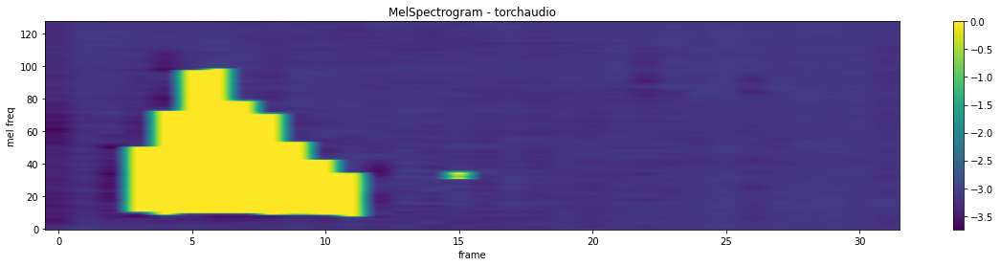

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


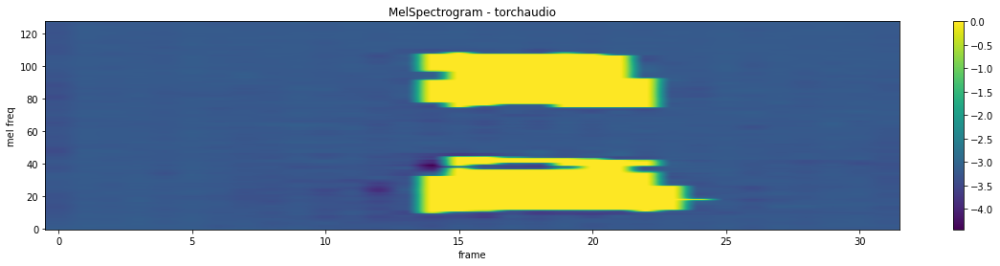

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


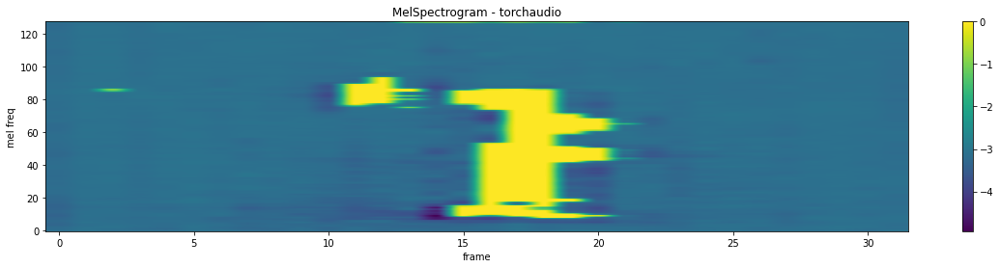

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


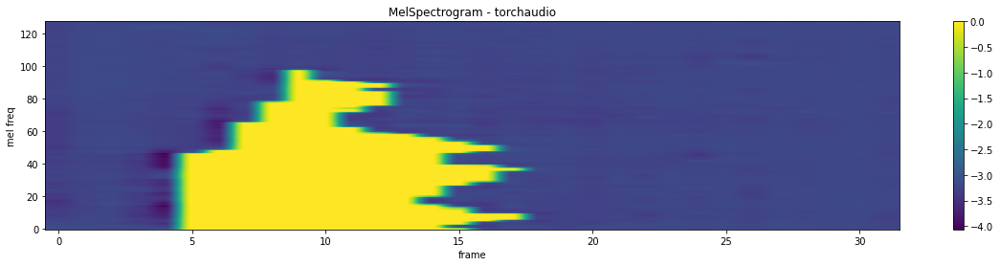

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


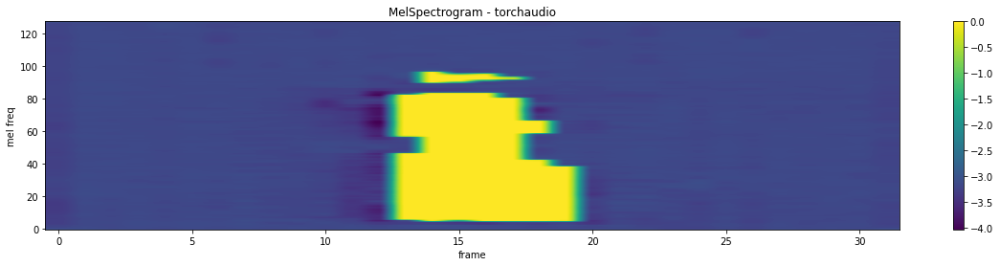

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


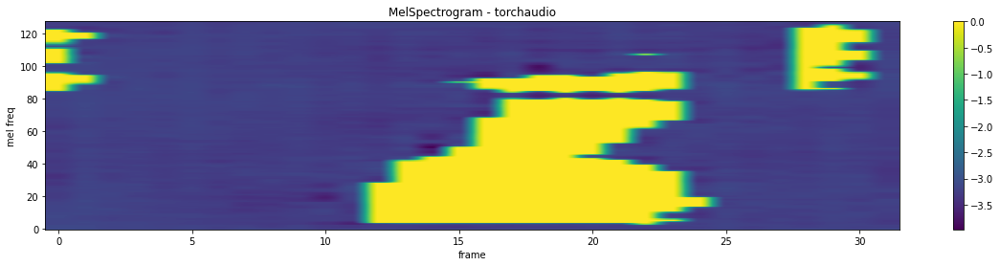

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


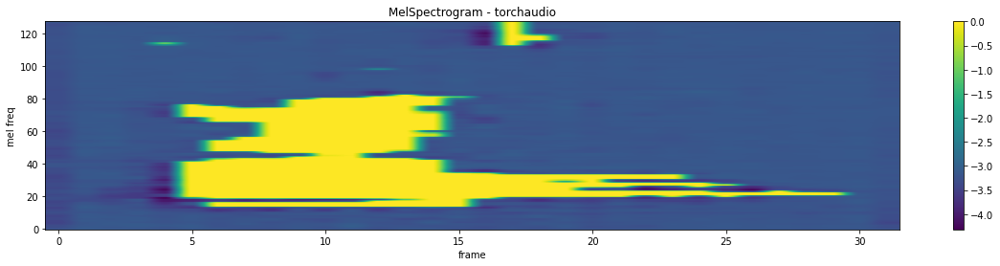

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


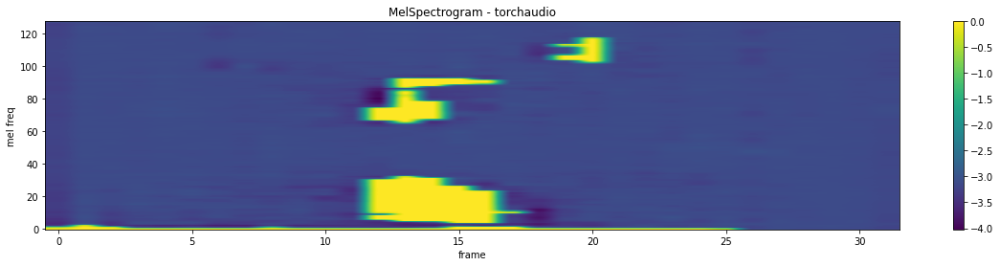

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


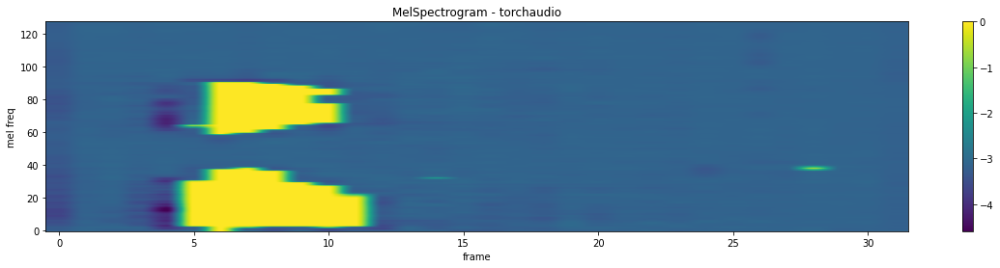

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


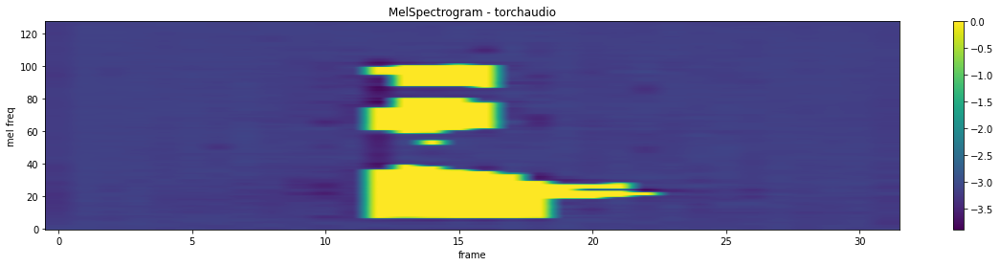

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


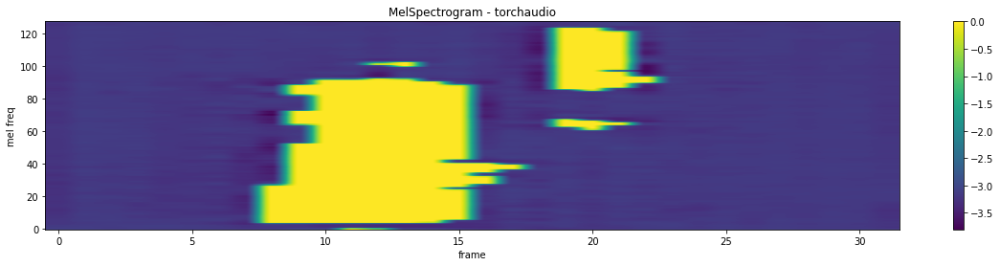

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


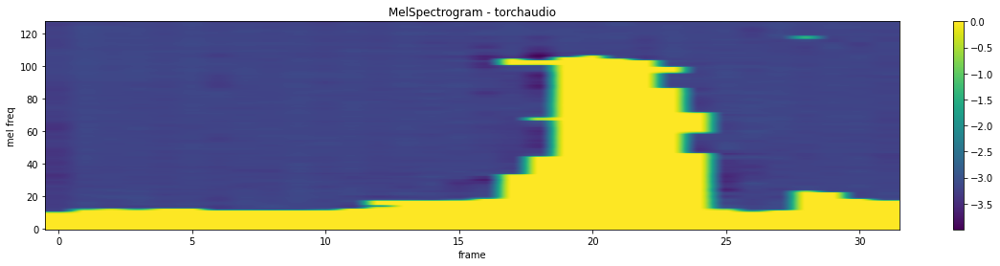

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


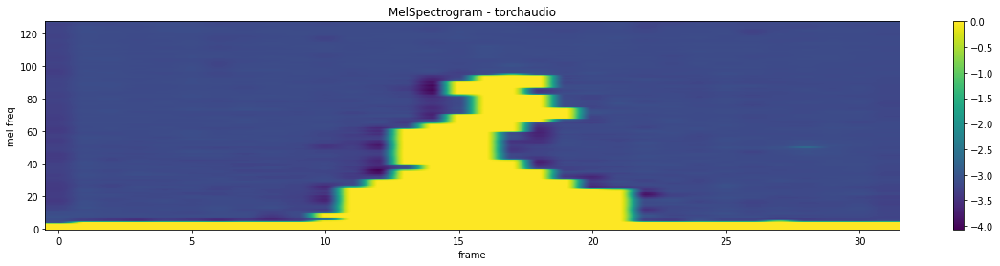

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


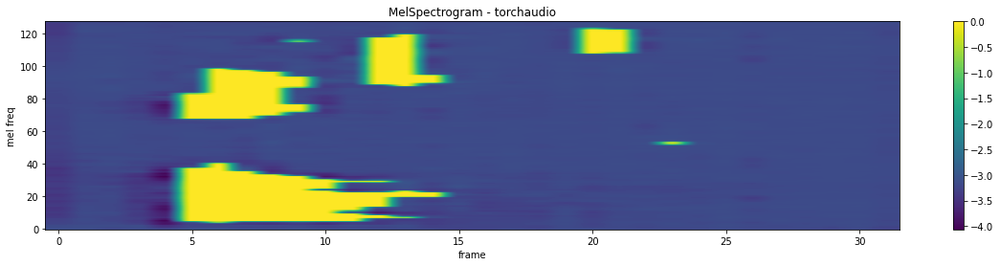

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


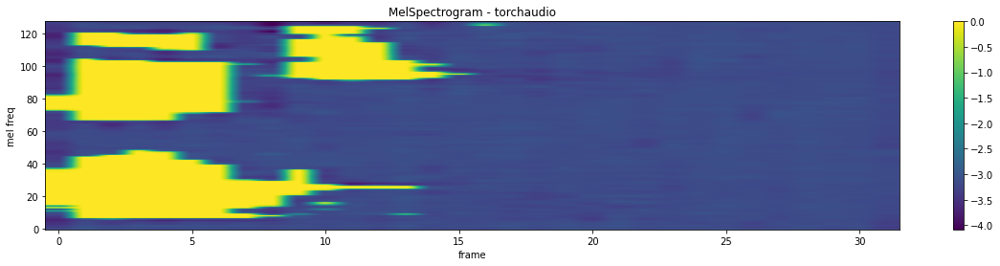

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


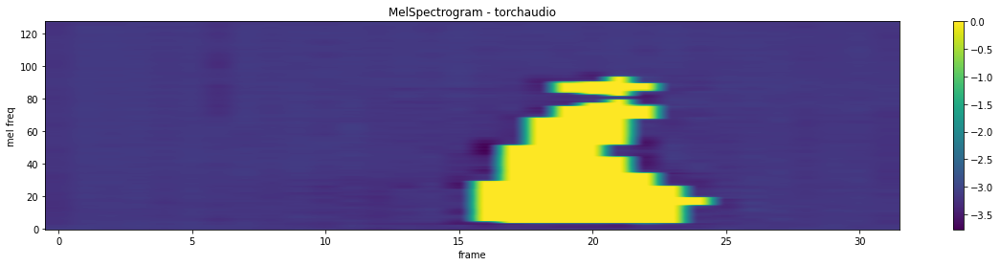

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


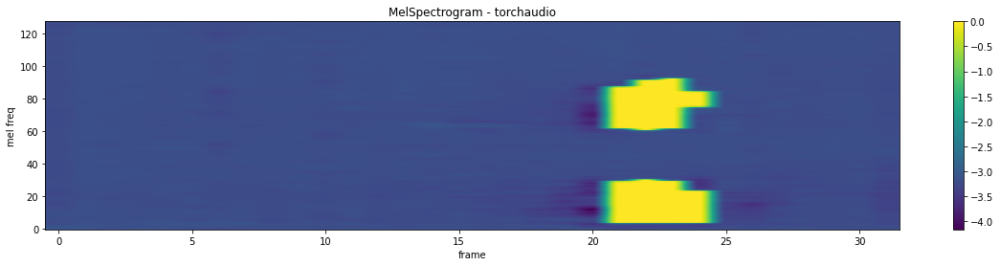

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


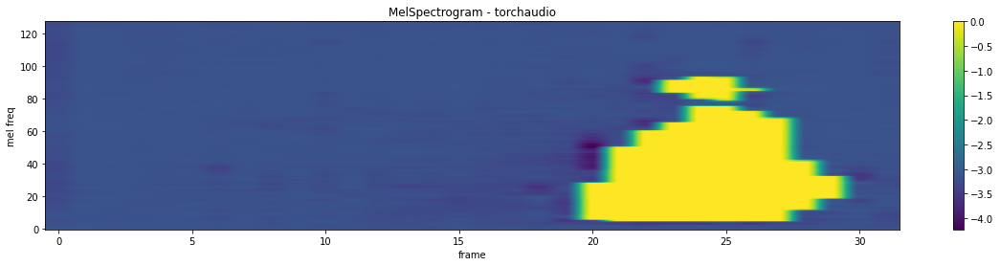

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


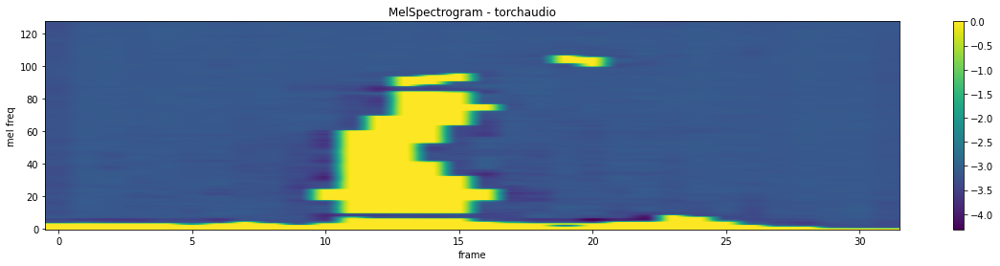

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


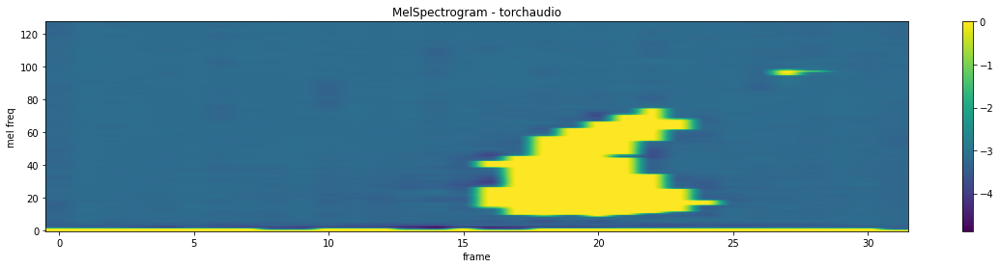

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


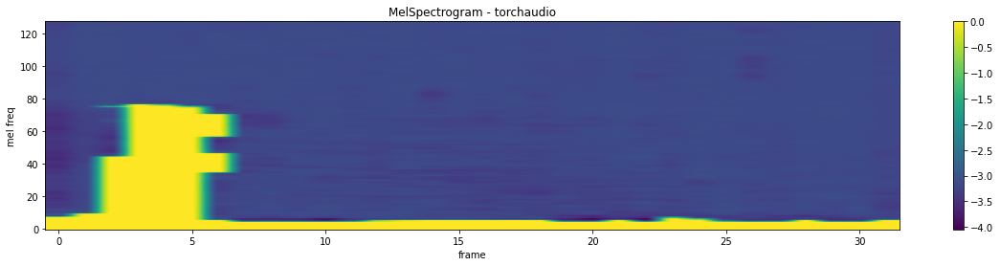

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


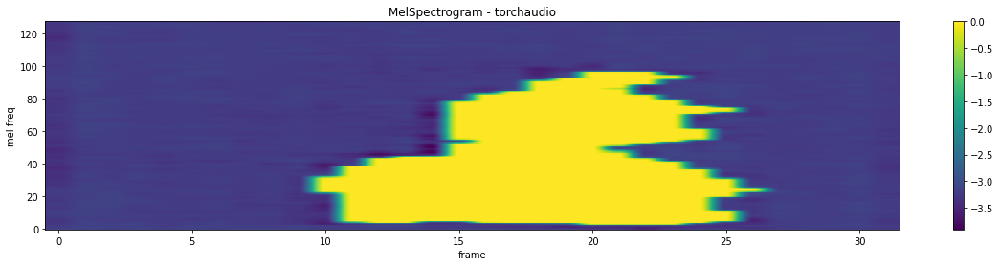

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


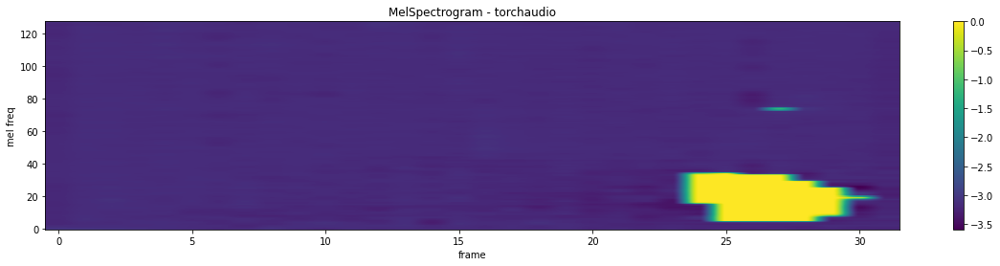

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


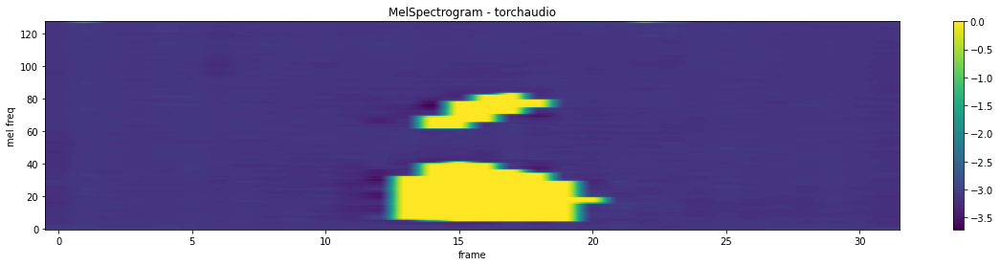

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


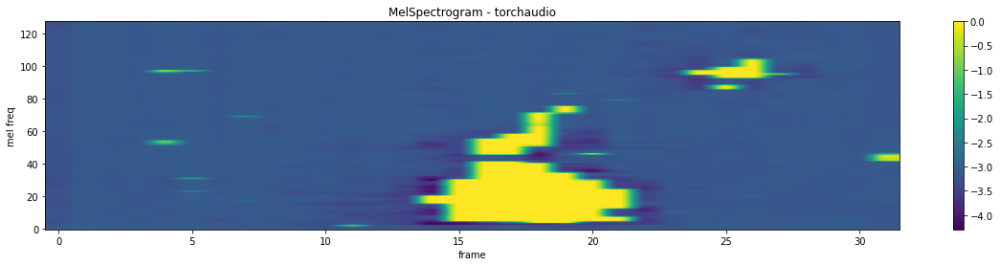

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


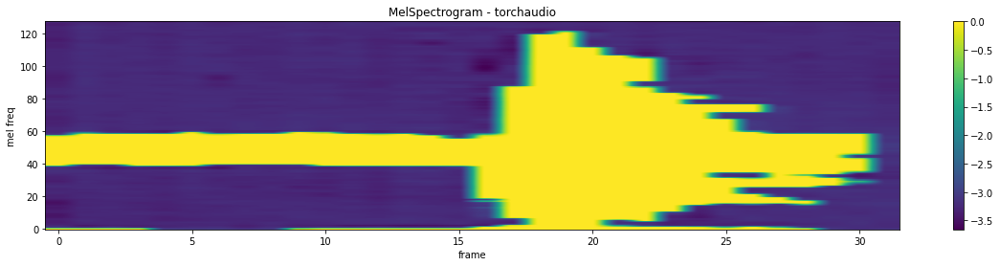

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


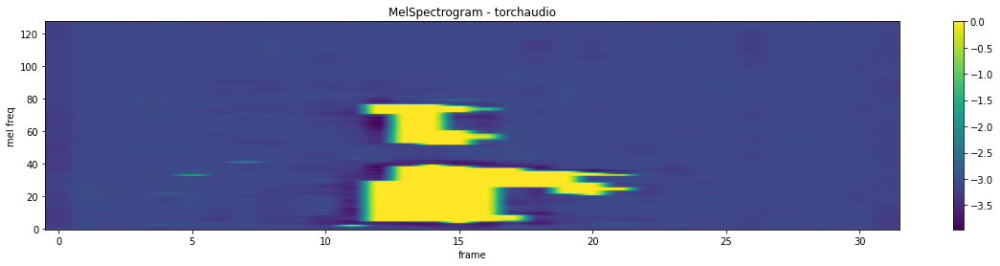

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


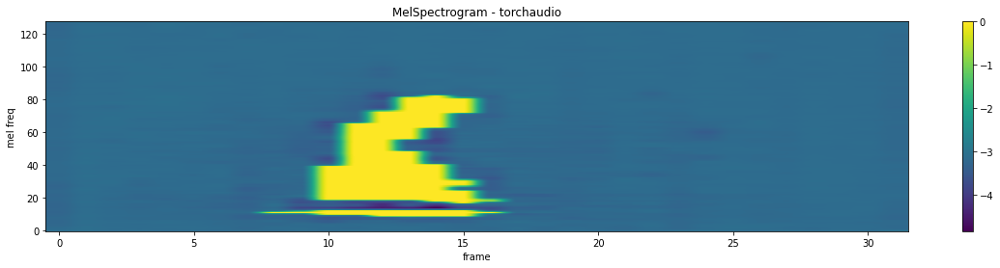

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


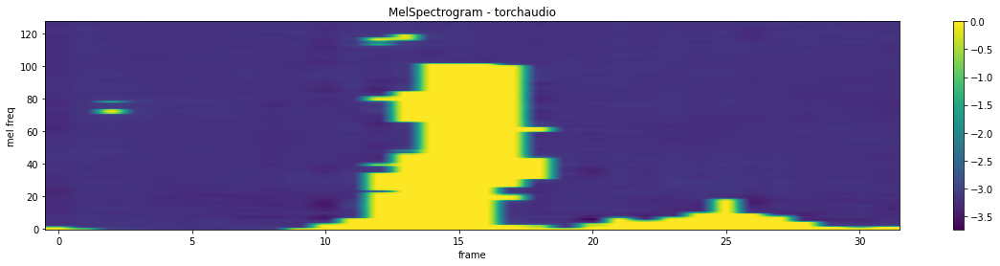

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


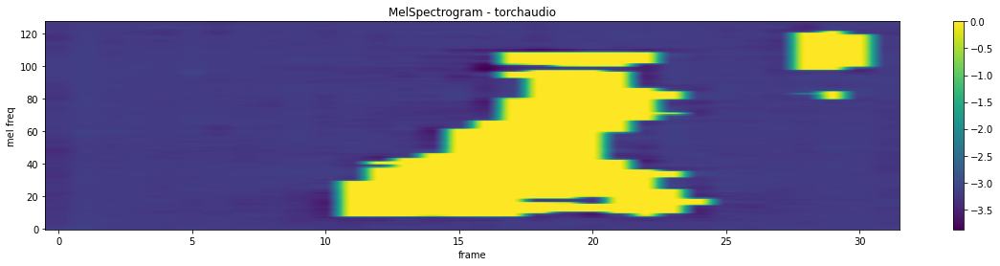

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


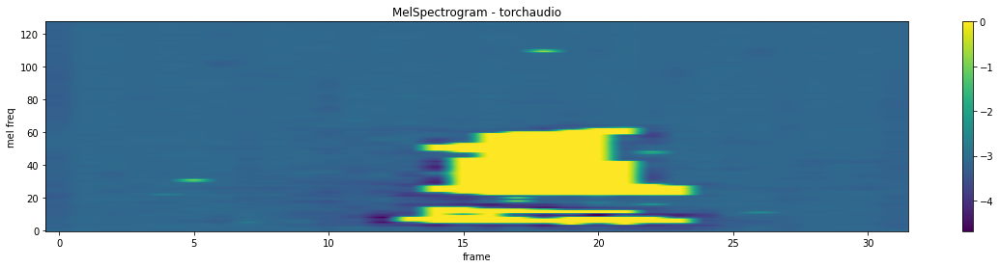

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


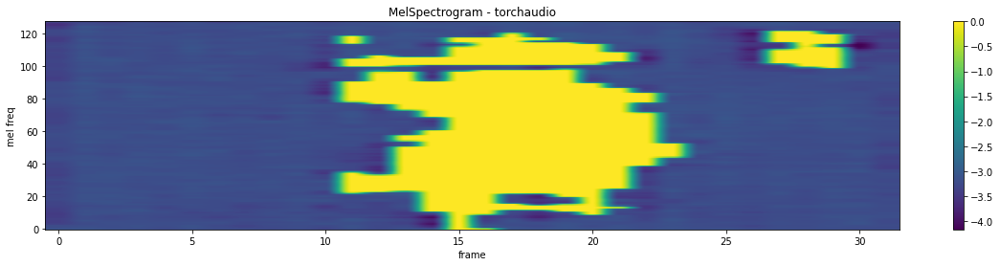

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


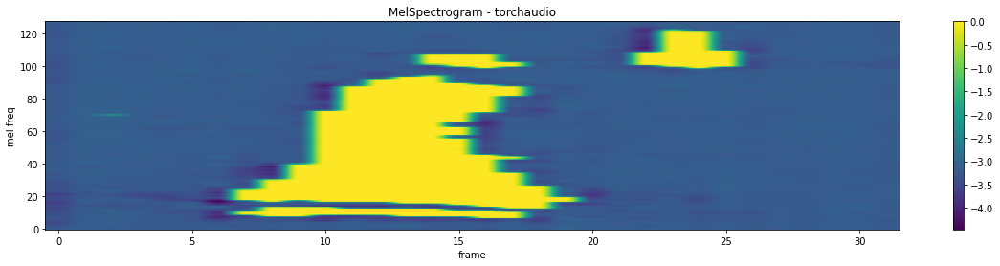

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


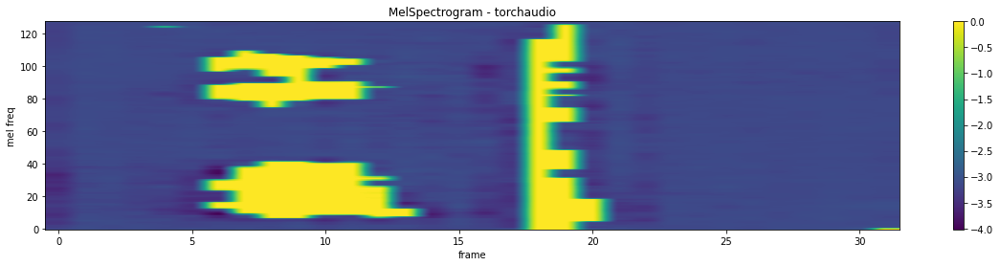

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


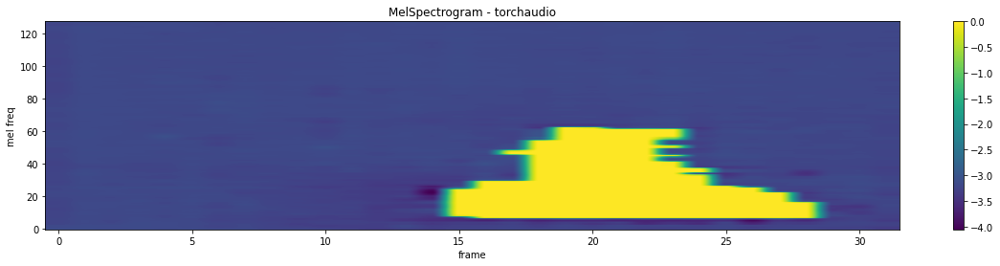

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


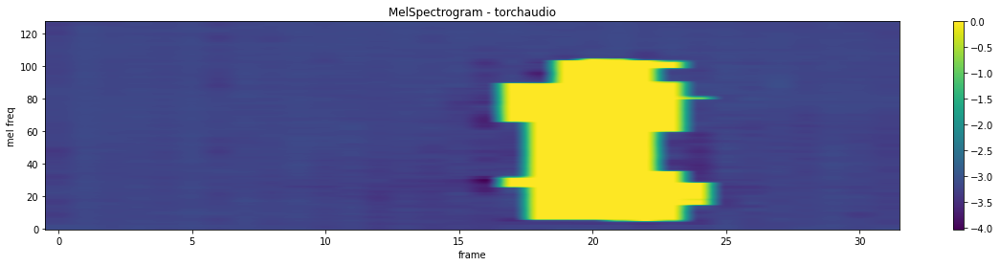

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


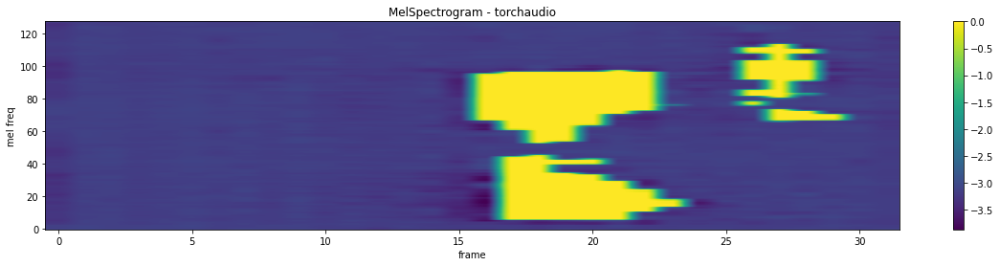

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


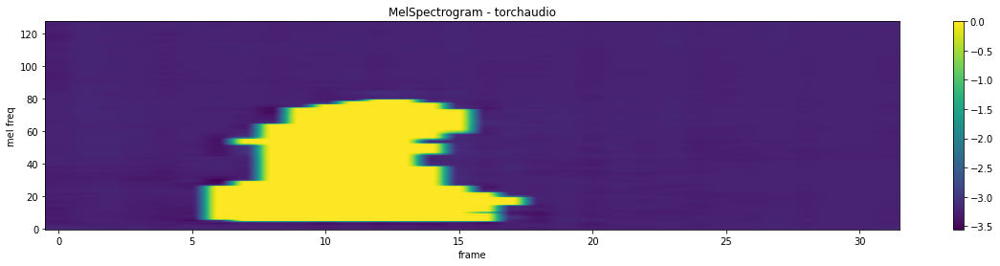

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


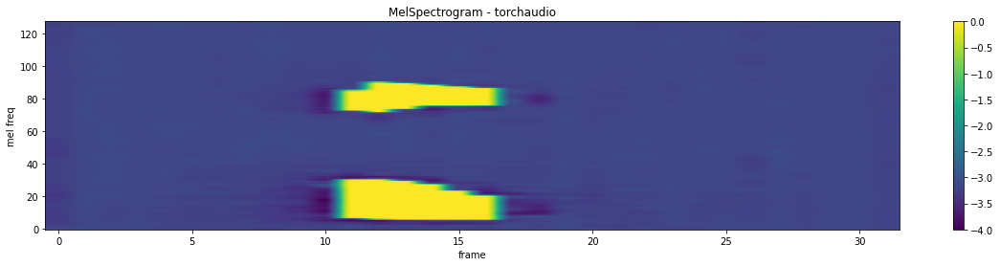

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


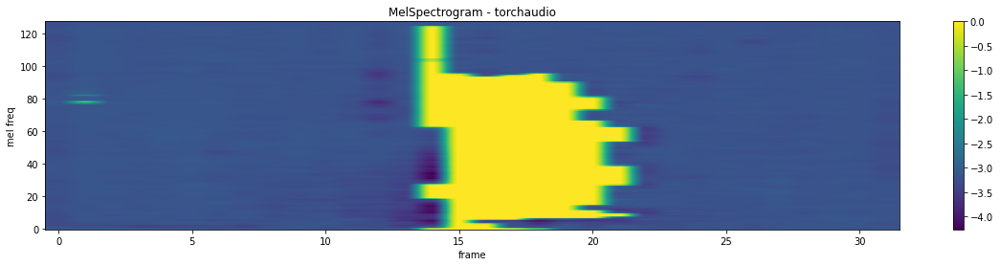

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


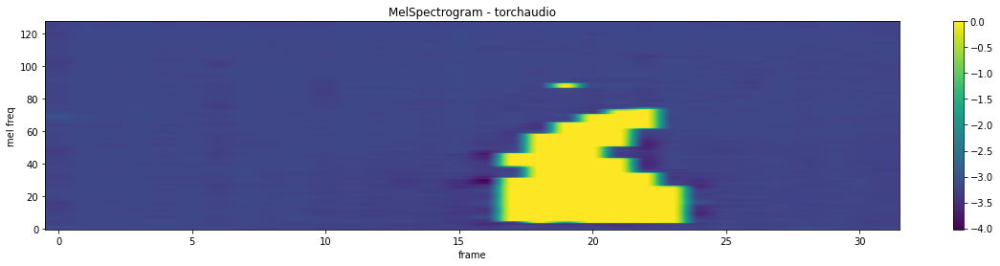

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


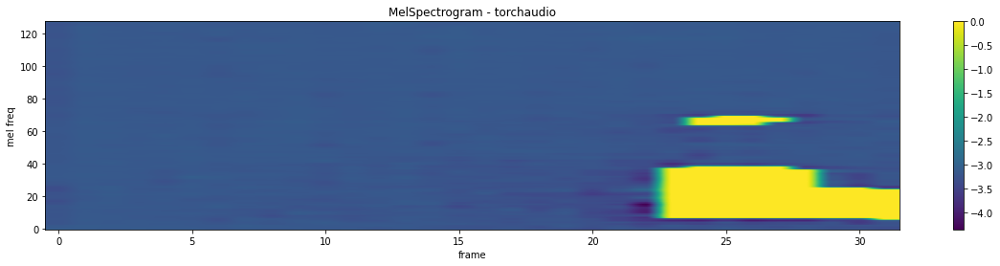

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


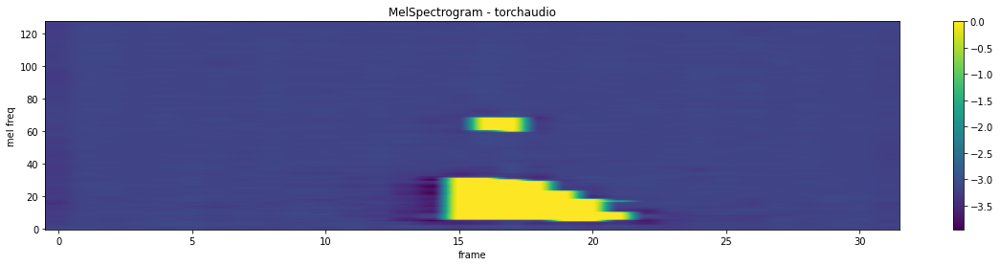

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


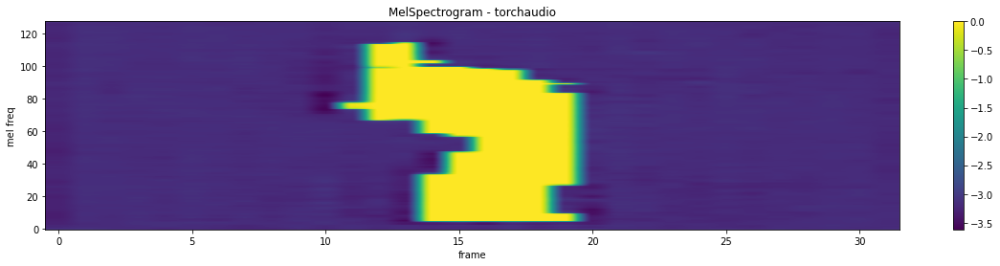

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


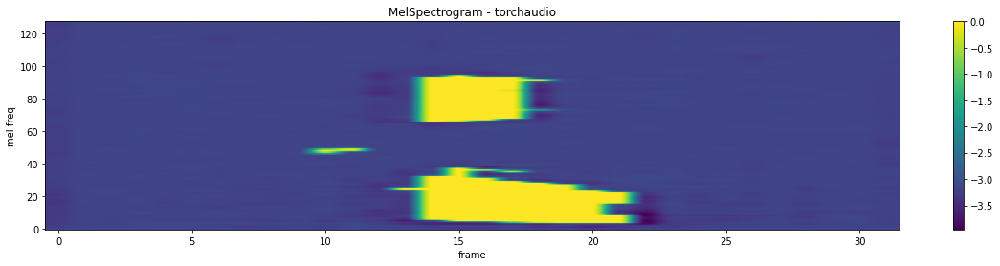

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


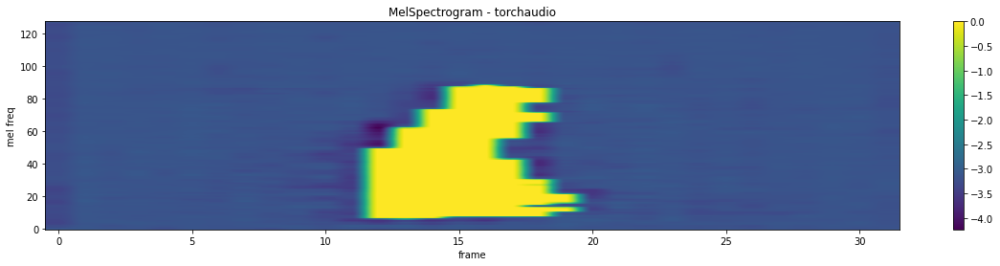

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


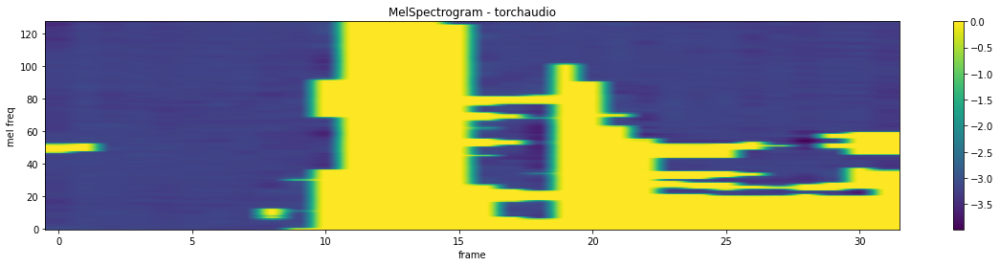

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


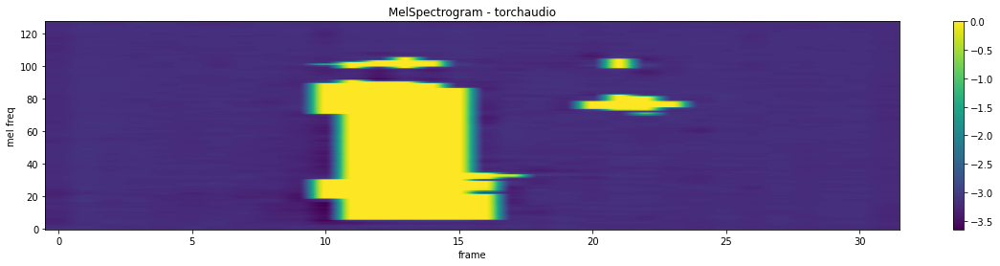

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


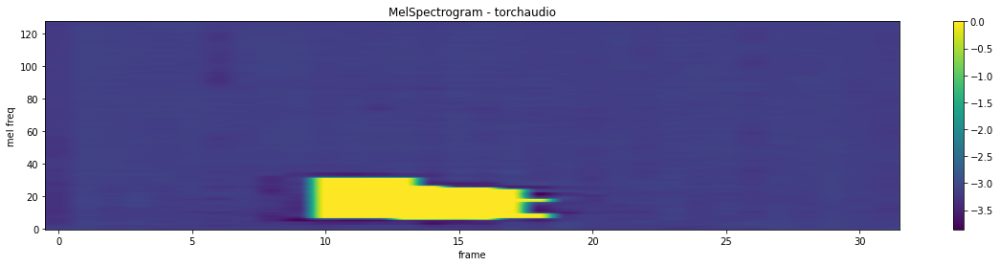

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


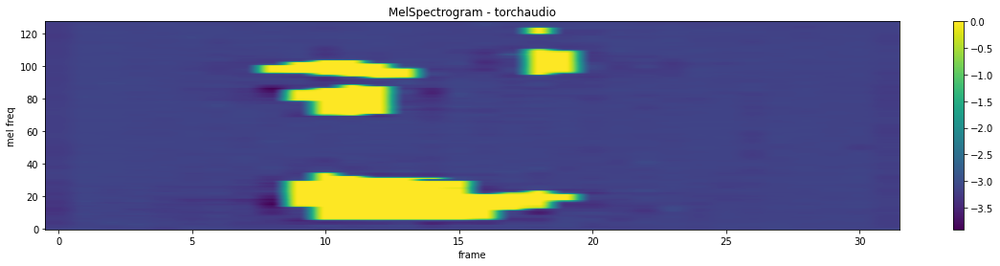

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


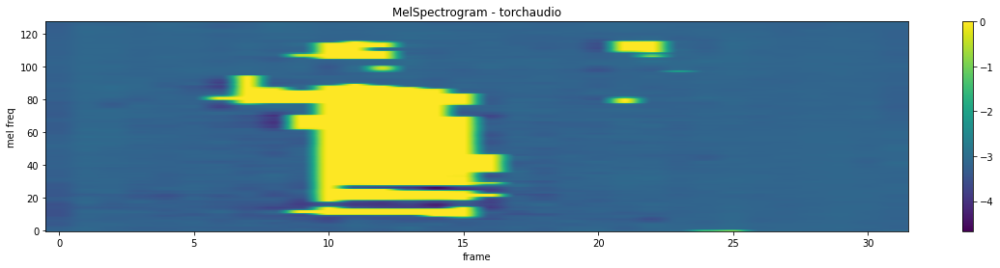

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


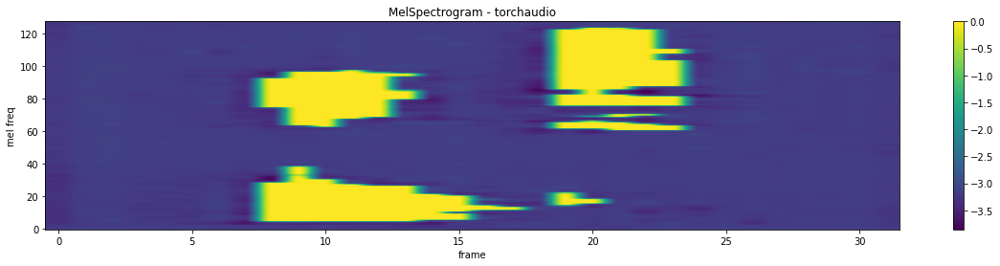

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


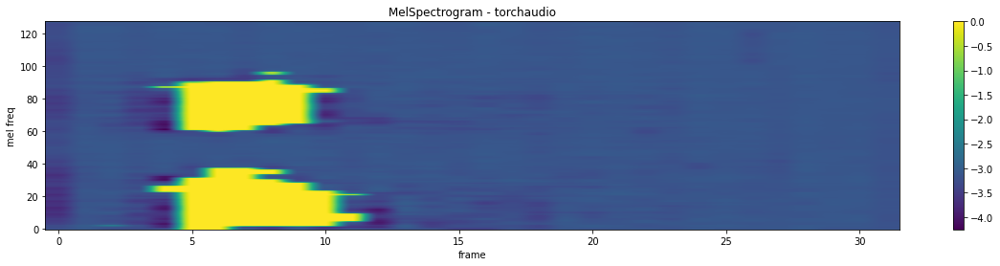

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


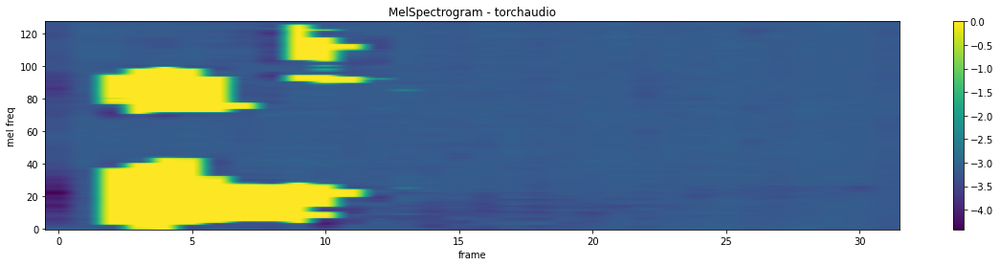

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


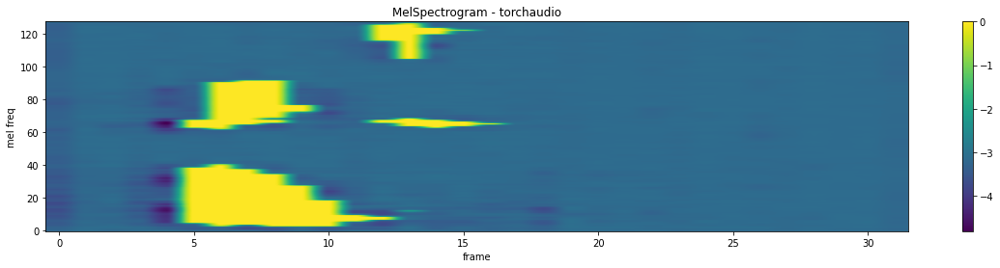

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


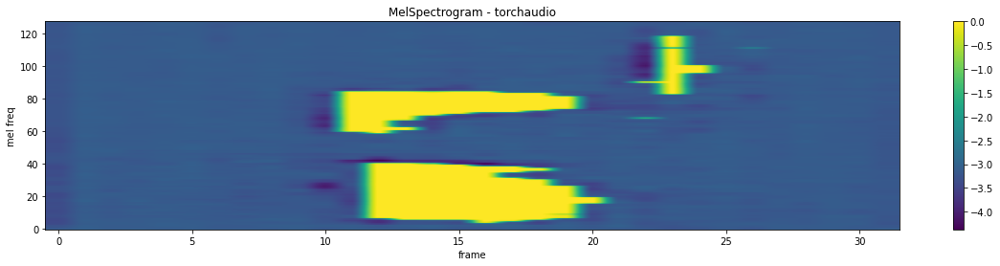

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


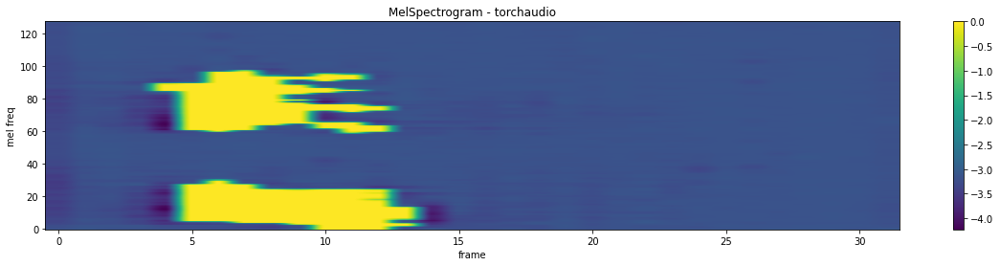

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


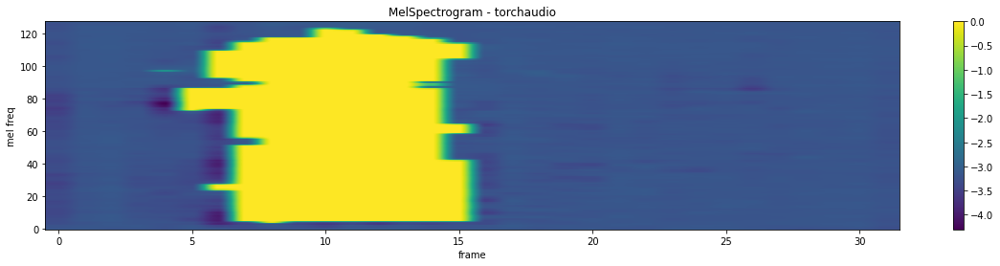

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


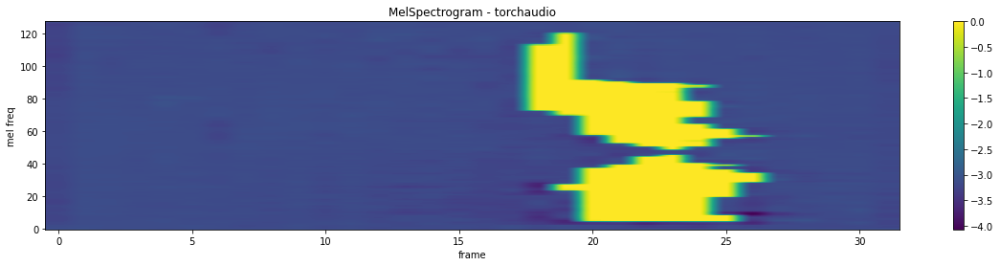

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


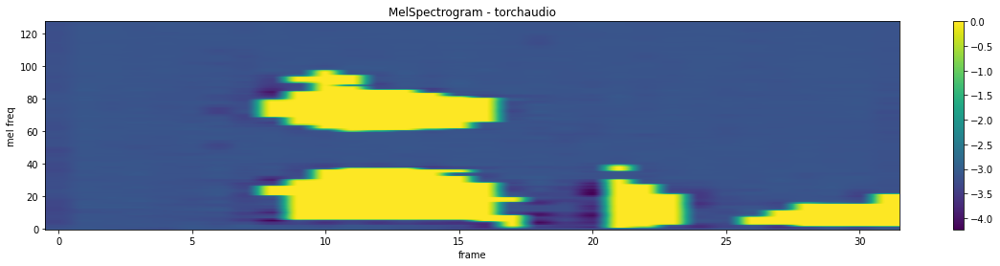

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


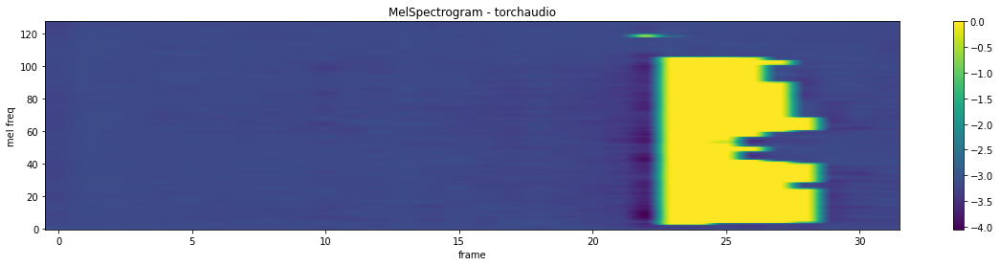

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


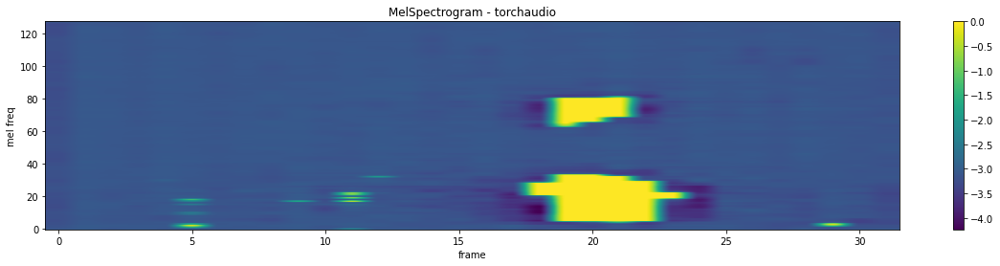

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


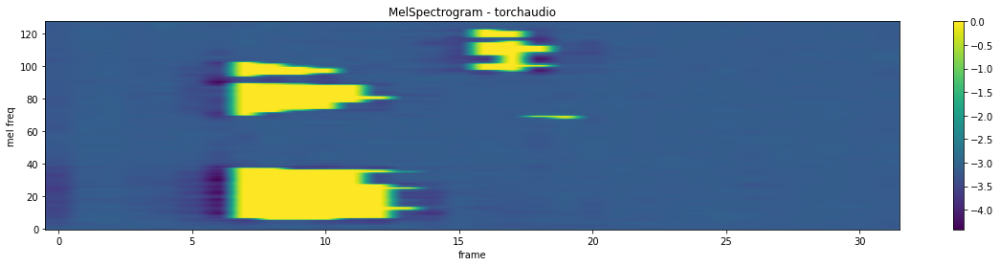

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


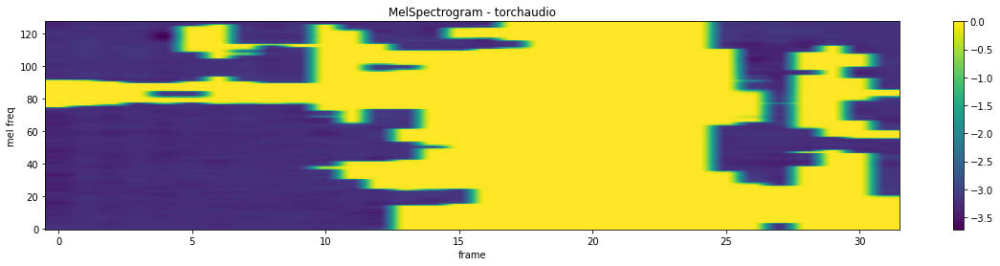

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


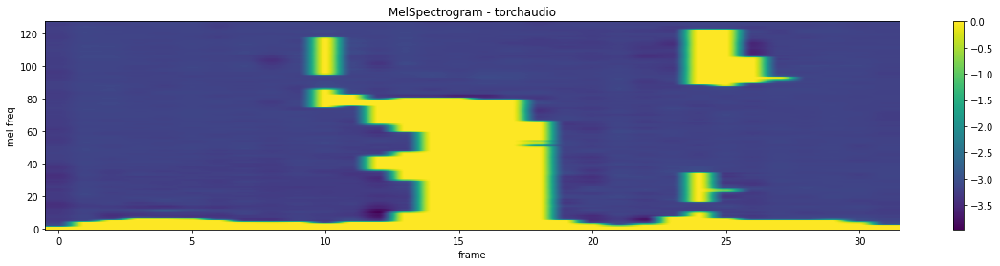

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


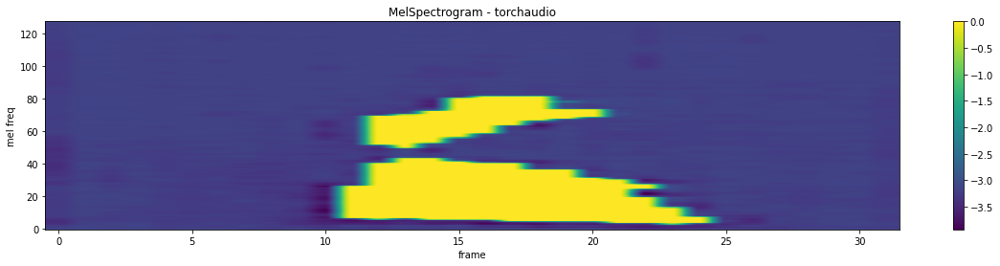

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


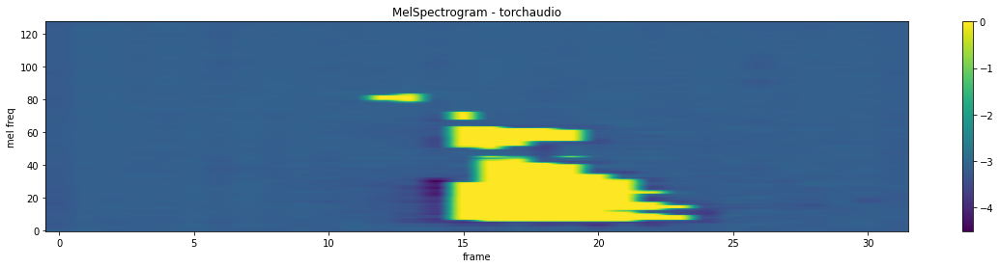

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


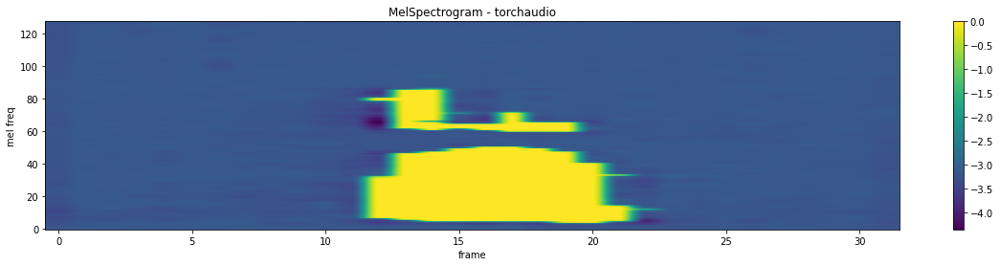

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


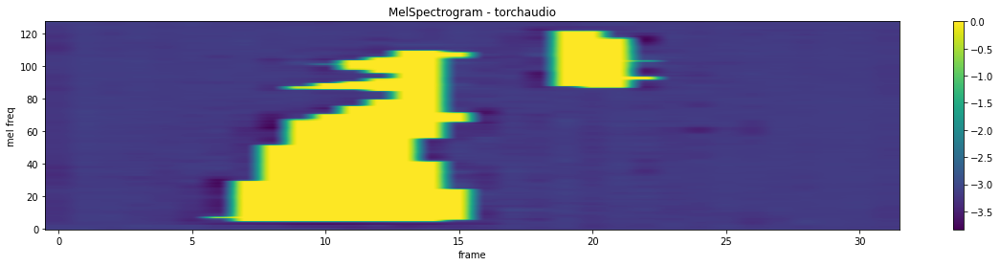

<Figure size 720x2160 with 0 Axes>

torch.Size([128, 32])


KeyboardInterrupt: ignored

In [ ]:
import matplotlib.pyplot as plt
test_loss = 0
print_per = 10
fig=plt.figure(figsize=(128, 32))
columns = 2
rows = 5
with torch.no_grad():
    for i, (images, _) in enumerate(train_dataloader):
        images = images.to(device)
        recon_batch, mu, logvar = model(images)
        print(recon_batch[0][0].shape)
        plot_spectrogram(
        recon_batch[0][0], title="MelSpectrogram - torchaudio", ylabel='mel freq')